In [0]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import scipy
from scipy.io import loadmat
from scipy.io import savemat
import matplotlib.pyplot as plt 
import pandas as pd
import struct
import os
import json
import sys
import seaborn as sns 
from scipy import signal, stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture as GMM

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


# **Data**
- Wagenaar data
- burst detection 
- averaged over channels 
- peak aligned and zero padded 
- 13092 bursts (n) x 3410 time bins (10 ms)

## **Cutted Data**
- because of peak alignment and zero padding artiifically inflation of dimension
- cut time axis on both ends
- First cut: 13092 bursts (n) x 1500 time bins (10 ms)
- Second cut: 13092 bursts (n) x 100 time bins (10 ms)

In [3]:
data_burst_by_time = np.load('/content/gdrive/My Drive/Burst_data/data_burst_by_time.npy').T
data_burst_by_time_shuffled = (np.random.permutation(data_burst_by_time))
print("Averaged over channels: ", data_burst_by_time.shape)
print(data_burst_by_time.shape)
print(data_burst_by_time_shuffled.shape)

Averaged over channels:  (13092, 3410)
(13092, 3410)
(13092, 3410)


In [4]:
dataset_cutted = data_burst_by_time[:,1000:2500] # 1. cut 1000 - 2500 2. cut 1200 - 2200
dataset_cutted2 = data_burst_by_time[:,1200:2200]
print("First Cut: ", dataset_cutted.shape)
print("Second Cut: ", dataset_cutted2.shape)

First Cut:  (13092, 1500)
Second Cut:  (13092, 1000)


## Helper functions for plotting

In [0]:
from matplotlib import cm
import warnings


def plot_cluster_representatives(burst_data, labels, n_clusters,figsize=(30,15)):
    """Plot cluster centroids for each cluster indicated by labels.
    
    Args:
        burst_data (nd.array): Array containing burst data (burst x time)
        labels (list): List of corresponding labels
        n_clusters (int): Number of clusters
        figsize (tuple): 
    Returns:
        Plot of centroid burst for each cluster
    """
    representatives = [] # list of centroid burst information
    
    for i in range(n_clusters):
        class_i = burst_data[np.where(labels == i)] # extract cluster_i from data 
        representative = np.mean(class_i, axis = 0) # centroid
        quantile1 = np.quantile(class_i, 0.25, axis=0) # Q1
        quantile3 = np.quantile(class_i, 0.75, axis=0) # Q3 
        median = np.median(class_i, axis = 0) # Median
    
        representatives.append([representative,quantile1,quantile3,median]) # add to list of centroid burst information

    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    
    if n_clusters < 10:
        colors = ["C" + str(i) for i in range(n_clusters)] # ensure distinct coloring as long as possible
    else:
        colors = cm.rainbow(np.linspace(0, 1, n_clusters))
    
    rows = int(np.ceil(n_clusters/3)) # arrange plot: n rows * 3 columns 
    for i in range(n_clusters):
        if i < n_clusters:
            count = i + 1 # get position
        ax = fig.add_subplot(rows, 3, count) 
        ax.set_ylim([0,max(representatives[i][2]) * 1.1]) # set y_lim for each cluster
        
        for j,representative in enumerate(representatives):
            if i == j: # plot centroid + median + Q1,Q3 of current class 
                ax.plot(representative[0], color = colors[i], lw = 3, label = "Mean")
                ax.plot(representative[3], color = colors[i], lw = 3, ls = '--', label = "Median")
                ax.fill_between(range(len(representative[1])), representative[1],representative[2],color = colors[i],alpha=0.5, label = "Q1-Q3")
                #ax.plot(representative[1], color = colors[i], lw = 1, ls = '--')
                #ax.plot(representative[2], color = colors[i], lw = 1, ls = '--')
                ax.legend()
            else: # for comparison and relation information plot all other centroids in same plot 
                ax.plot(representative[0], color = colors[j], alpha=0.3)
                #ax.plot(representative[1], color = colors[j], alpha=0.3)
                #ax.plot(representative[2], color = colors[j], alpha=0.3)
            
            ax.set_xlabel("Time")
            ax.set_title("Class %i " % i)
            

def plot_normalized_cluster_examples(burst_data, labels, n_clusters, figsize=(30,15)):
    """Plot normalized burst examples for each cluster indicated by labels.
    
    Args:
        burst_data (nd.array): Array containing burst data (burst x time)
        labels (list): List of corresponding labels
        n_clusters (int): Number of clusters
        figsize (tuple): 
    Returns:
        Plot of normalized burst examples for each cluster
    """
    
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    rows = int(np.ceil(n_clusters/3)) # arrange plot: n rows * 3 columns 
    if n_clusters < 10:
        colors = ["C" + str(i) for i in range(n_clusters)] # ensure distinct coloring as long as possible
    else:
        colors = cm.rainbow(np.linspace(0, 1, n_clusters))
        
    for i in range(n_clusters):
        #class_i = burst_data[np.where(labels == i)]
        class_i = np.random.permutation(burst_data[np.where(labels == i)]) # extract cluster_i from data
        if i < n_clusters:
            count = i + 1 # get position 
        ax = fig.add_subplot(rows, 3, count)
        
        for j,burst in enumerate(class_i[0:100]):
            amplitude = max(burst)
            normalized_burst = burst/amplitude # normalize plots to have amplitude of 1 
            ax.plot(normalized_burst)#, color = colors[i])
        
        ax.set_xlabel("Time")
        ax.set_title("Class %i " % i)
        
        
import matplotlib.ticker as ticker
def plot_class_counts(culture_counts, culture_names, labels, relative_counts = True):
    """Plot amount of bursts falling in each cluster for each culture side by side 
    
    Args:
        culture_counts (list): List containing the number of bursts per culture with inices corresponding to culture names
        culture_names (list): List of culture names 
        labels (list): List of labels per burst
        relative_counts (bool): display counts relative to culture size 
    
    Returns:
        Plot of counts of bursts falling in each cluster for each culture
    """
    
    cultures = [] # list of length n containing the culture name for each burst
    for i,culture in enumerate(culture_names):
        cultures += list(np.repeat(culture, culture_counts[i])) # 

    df_dict = {}
    df_dict["Culture"] = cultures
    df_dict["Class"] = labels

    df = pd.DataFrame.from_dict(df_dict) # create dataframe with labels and culture for each burst
    ncount = len(df)
    
    plt.figure(figsize=(20,15))
    ax = sns.countplot(x="Culture", hue = "Class", data=df)

    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        #ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y),
        ax.annotate('{:.0f}'.format(y), (x.mean(), y), # annotate counts 
            ha='center', va='bottom') # set the alignment of the text

    # Use a LinearLocator to ensure the correct number of ticks
    ax.yaxis.set_major_locator(ticker.LinearLocator(11))
    ax.set_ylim(0,ncount)
    ax.set_ylabel("Absolute Count")
    ax.set_title("GMM Class Distribution in clustered Cultures")
    
    if relative_counts:
        df_grouped = df
        df_grouped["Count"] = 1
        #df_grouped.head()
        df_grouped = df.groupby(['Culture', 'Class'])["Count"].sum().reset_index(name='Count') # count bursts per class and culture

        for i, culture in enumerate(culture_names):
            df_grouped.loc[df_grouped["Culture"] == culture,["Count"]] = df_grouped[df_grouped["Culture"] == culture]["Count"].div(culture_counts[i])*100 # get relative count
            
        plt.figure(figsize=(20,15))
        ax = sns.barplot(x="Culture", y="Count", hue = "Class", data=df_grouped)

        for p in ax.patches:
            x=p.get_bbox().get_points()[:,0]
            y=p.get_bbox().get_points()[1,1]
            ax.annotate('{:.1f}'.format(y), (x.mean(), y), # annotate counts
                    ha='center', va='bottom') # set the alignment of the text

        # Use a LinearLocator to ensure the correct number of ticks
        ax.yaxis.set_major_locator(ticker.LinearLocator(11))
        ax.set_ylabel("% of Culture")
        ax.set_ylim(0,105)
        ax.set_yticks(np.arange(0,105,10))
        ax.set_title("GMM relative Class Distribution in clustered Cultures")


def plot_eigenvalues(eigval,cutoff,value_beginning = 0, value_ending=50):
    """Plot eigenvalues in ascending order and draw line to indicate eigenvalue gap 
    
    Args:
        eigval (list): List containing eigenvalues in ascending order
        cutoff (int): Index of eigenvalue gap
        value_beginning (int): Start-index of eigenvalues to draw
        value_ending (int): End-index of eigenvalues to draw 
    
    Returns:
        Plot of Eigenvalues in ascending order starting from value_beginning to value_ending with marked eigenvalue gap 
    """
    print(cutoff, eigval[cutoff])
    plt.figure(figsize=(20,10))
    plt.scatter(range(50),eigval[value_beginning: value_ending])
    plt.axhline(eigval[cutoff-1] + (eigval[cutoff]-eigval[cutoff-1])/2, c="red", linestyle = "--", label = "cutoff")
    plt.xticks(list(plt.xticks()[0]) + [cutoff-1] )
    plt.xlabel("Eigenvalues")
    plt.ylabel("")
    plt.legend()
    plt.show()  



def plot_prediction_strength(k_predictions_strength_cv,valid_cluster_size,color = sns.color_palette('Reds', 25,)[::-1], n_folds = 5, k_clusters = None):
    """For each fold Plot prediction strength per cluster found by clusterings with differnt number of clusters k
    
    Args:
        k_predictions_strength_cv (dict): dictionary containing the prediction strength for each cluster in each fold found by clustering with k-clusters.
                                          key = k (number of clusters in clustering)
                                          value = n_folds x k_clusters (for each fold prediction strenght of each individual cluster)
        valid_cluster_size (dict): dictionary containing the size (number of bursts) for each cluster in each fold found by clustering with k-clusters.
                                          key = k (number of clusters in clustering)
                                          value = n_folds x k_clusters (for each fold cluster size of each individual cluster)
        color (cm): color map
        n_folds (int): number of folds in data
    
    Returns:
        For each burst a plot of the prediction strength of each cluster found by clustering with k clusters. Point size indicates the size of each cluster in percent of the whole data used to calculate the prediction strength.
    """
    
    plt.rc('xtick', labelsize=30)
    plt.rc('ytick', labelsize=30) 

    for f in range(n_folds): # plot foldwise
        fig, ax = plt.subplots(figsize=(30,16))
        ax_clusters = 1 # maximal number of k clusters cross validated with prediction strength to plot on x axis 
        if not k_clusters : 
           k_clusters = range(1,len(k_predictions_strength_cv)+1)

        for i in k_clusters:
            n_clusters = range(1,len(k_predictions_strength_cv[i][f])+1) #range(1,i+1) # clusters in clustering_i
            ax_clusters = max(ax_clusters,len(k_predictions_strength_cv[i][f])) #update maximal number of clusters
            #ax.errorbar(n_clusters, mean_k_prediction_strength[i], yerr=std_k_prediction_strength[i], color = "C0")
            if len(k_predictions_strength_cv[i][f])>0:
                ax.plot(n_clusters, k_predictions_strength_cv[i][f], color=color[i] , label = i) # plot prediction strenght per cluster for clustering i with k clusters
                ax.scatter(n_clusters, k_predictions_strength_cv[i][f], color=color[i], s = 10000 * np.asarray(valid_cluster_size[i])[f]/np.sum(valid_cluster_size[i][f])) # add points with size corresponding to percent of bursts falling into cluster (cluster size)
                #print(np.asarray(valid_cluster_size[i])[1]/np.sum(valid_cluster_size[i][1]) * 100)
                ax.annotate(str(len(k_predictions_strength_cv[i][f])), (n_clusters[len(k_predictions_strength_cv[i][f])-1] -0.1, k_predictions_strength_cv[i][f][-1] - 0.04), fontsize = 12) # annotate line with k used in clustering
                #ax.plot(range(1,22), [0-(i-1)*1 for x in range(21)], '-', color = "black")
                #ax.plot(range(1,22), [-0.2-(i-1)*1 for x in range(21)], '--', color = "red")

        leg1 = ax.legend(fontsize=12, loc = "lower left") # add legend for lines


        color_index = len(color)//2


        # add legend for point size indicating cluster size 
        
        l1 = ax.scatter([],[], s=10000 * 0.01, edgecolors='none', color =color[color_index]) # point size corresponding to 1%
        l2 = ax.scatter([],[], s=10000 * 0.03, edgecolors='none', color =color[color_index]) # 3%
        l3 = ax.scatter([],[], s=10000 * 0.05, edgecolors='none', color =color[color_index]) # 5%
        l4 = ax.scatter([],[], s=10000 * 0.10, edgecolors='none', color =color[color_index]) # 10%
        l5 = ax.scatter([],[], s=10000 * 0.25, edgecolors='none', color =color[color_index]) # 25%
        l6 = ax.scatter([],[], s=10000 * 0.50, edgecolors='none', color =color[color_index]) # 50
        l7 = ax.scatter([],[], s=10000 * 0.75, edgecolors='none', color =color[color_index]) # 75%
        l8 = ax.scatter([],[], s=10000 * 0.90, edgecolors='none', color =color[color_index]) # 90%

        labels = ["1%", "3%", "5%", "10%", "25%", "50%", "75%", "90%"]
        leg2 = ax.legend([l1, l2, l3, l4, l5, l6, l7, l8], labels, ncol=4,  title = "Cluster Size (%) ", fontsize=15, loc = "upper right", borderpad = 3, scatterpoints = 1, columnspacing = 2.5,labelspacing = 5.5,  handletextpad = 2.5)


        ax.set_title("Fold %d Prediction Strength" % (f+1), fontsize=40) 
        ax.set_xticks(range(1,ax_clusters+1))
        ax.set_xlabel("Number of clusters",fontsize=30)
        ax.set_ylabel("prediction strength",fontsize=30)
        ax.axhline(0.8)
        ax.set_xlim((1,21))
        ax.set_yticks(np.arange(0,1.2,0.1))
        yticks = ax.yaxis.get_major_ticks()
        yticks[0].label1.set_visible(False)
        yticks[-1].label1.set_visible(False)
        #yticks[-2].label1.set_visible(False)

        ax.add_artist(leg1)
        #ax.set_ylim ((-19, 0.5))
        #ax.set_yticks(range(0, -19, -1))
        #ax.set_yticklabels(range(2,21))


def plot_average_proportion_of_bursts_in_low_clusters_per_k(average_bad_cluster_size, average_bad_cluster_size_predicted, n_cluster = range(1,21)):
    """ Plot proportion of bursts falling into clusters with low prediction strength (below threshold=0.8) averaged over all folds:
        a) based on spectral clustering labels 
        b) based on labels assigned by nearest centroid clustering 
    
    Args:
        average_bad_cluster_size (list): average proportion of bursts falling into cluster with low prediction strenght for clustering with k clusters. 
                                         Clusters based on spectral clustering labels
        average_bad_cluster_size_predicted (list): average proportion of bursts falling into cluster with low prediction strenght for clustering with k clusters.
                                         Clusters based on assigned clusters by nearest centoids clustering
        n_cluster(list): range of k used in clustering
    
    Returns:
        For each k in clustering plot of the average proportion of bursts falling into clusters with low prediction strength. 
        Clusters: a) based on spectral clustering labels 
                  b) based on labels assigned by nearest centroid clustering 
    """
    
    fig, ax = plt.subplots(figsize=(30,16))
    n_clusters = range(1,21)
    ax.plot(n_clusters, average_bad_cluster_size, label = "Based on clusters separately fitted ", marker= "o"	, markersize = 15)
    #ax.plot(n_clusters, average_bad_cluster_size_predicted, label = "Based on clusters assigned by centroids of training data", marker = "o", markersize = 15) 
    for i, p in enumerate(average_bad_cluster_size):
        ax.annotate("%d %%" % int(np.round(p,0)), (n_clusters[i]+0.1, average_bad_cluster_size[i]+0.1), fontsize = 15)
        #ax.annotate("%d %%" % int(np.round(average_bad_cluster_size_predicted[i],0)), (n_clusters[i]+0.1, average_bad_cluster_size_predicted[i]-0.2),fontsize = 15)
    ax.set_title(" Burst in Clusters below 0.8 prediction Strength threshold", fontsize = 40) 
    ax.set_xticks(n_clusters)
    ax.set_xlabel("Number of clusters",fontsize=30)
    ax.set_ylabel("% of validation bursts",fontsize=30)
    ax.set_xlim((n_clusters[0],n_clusters[-1]+1))
    ax.legend(fontsize = 20, loc = "upper left")

# **Splitting the Data into Training and Validation Sets**

## Training and Validation split culterwise 
- dataset ordered by culture
- for each culture randomly put 75% of the burst into the training and 25% into the validation set


In [0]:
#culture_counts = [141, 531, 1656, 235, 231, 30, 156, 270, 416]
#culture_names = ["C11","C12","C24","C26","C51","C52","C53","C71","C72"]
culture_counts = [141, 531, 128, 194, 1782, 2112, 1656, 554, 235, 661, 143, 142, 2853, 61, 338, 231, 30, 156, 270, 416, 77, 96, 285] # bursts per culture 
culture_names = ["C11","C12","C15","C21","C22","C23","C24","C25","C26","C31","C32", "C33", "C34","C35","C36", "C51","C52","C53","C71","C72","C81","C82","C83"]

In [0]:
np.random.seed(6)
training_split = [] # list containing indices of training bursts
culture_border = np.sort(np.append(np.cumsum(culture_counts),0)) # get index of bursts belonging to each culture in dataset

for i,culture_count in enumerate(culture_counts):
    if i+1 < len(culture_border): # still in range of cultures 
        training_split_index = np.random.choice(np.arange(culture_border[i], culture_border[i+1]), int(0.75*culture_count),replace=False) # randomly select 75% of indices within culture_i
        training_split += list(training_split_index) # add 75% of culture_i to training data
        

training_split = np.sort(training_split) # sort indices of training bursts   
validation_split = np.delete(np.arange(0,len(datset_cutted2)), training_split) # rest of the bursts for validation

In [0]:
training_set = dataset_cutted2[training_split]  #data_burst_by_time[training_split] # extract training bursts from dataset with indices
validation_set = dataset_cutted2[validation_split]  #data_burst_by_time[test_split] # extract validation bursts from dataset with indices 

## k-fold split
- split dataset into 5 folds and build training and validation sets for cross validation

In [0]:
def k_fold_split(data,k_folds = 5): 
    """ Split data into k folds and build training and validation set with ratio 4:1 for all fold combinations 
    
    Args:
        data (nd.array): Array containing data (n x m)
        k_folds (int): Number of folds to split the data
    
    Returns:
        train_folds (list of nd.arrays): list of k training set indices each with dimension n-(n/k) x m
        valid_folds (list of nd.arrays): list of k validation set indices each with dimension n/k x m
    """
    fold_length = int(data.shape[0]/k_folds) #length of each fold
    valid_folds = []
    train_folds = []
    for i in range(k_folds-1):
        valid_folds += [data[i*fold_length:(i+1)*fold_length]] 
        train_folds += [np.delete(data, range(i*fold_length,(i+1)*fold_length), axis = 0)]
      
    valid_folds += [data[(k_folds-1)*fold_length:]]
    train_folds += [np.delete(data, range((k_folds-1)*fold_length, len(data)), axis = 0)]
    return train_folds, valid_folds 

In [0]:
n_total = dataset_cutted2.shape[0] # total number of bursts in data
n_shuffled = np.random.RandomState(seed=42).permutation(n_total) # randomly shuffle data 

train_folds, valid_folds = k_fold_split(n_shuffled, k_folds = 5) # k fold split indices 

In [0]:
np.save('/content/gdrive/My Drive/Burst_data/train_folds_gmm',train_folds) # save training split indices
np.save('/content/gdrive/My Drive/Burst_data/valid_folds_gmm',valid_folds) # save validation splits indices

In [0]:
#train_folds = np.load("/content/gdrive/My Drive/Burst_data/train_folds.npy",allow_pickle=True)
#valid_folds = np.load("/content/gdrive/My Drive/Burst_data/valid_folds.npy",allow_pickle=True)

train_folds_gmm = np.load("/content/gdrive/My Drive/Burst_data/train_folds_gmm.npy",allow_pickle=True)
valid_folds_gmm = np.load("/content/gdrive/My Drive/Burst_data/valid_folds_gmm.npy",allow_pickle=True)

In [7]:
for i, fold in enumerate(train_folds_gmm):
    print("Fold %d: Training Data: %d Bursts Validation Data: %d Bursts" % ((i+1),len(fold), len(valid_folds_gmm[i])))

Fold 1: Training Data: 10474 Bursts Validation Data: 2618 Bursts
Fold 2: Training Data: 10474 Bursts Validation Data: 2618 Bursts
Fold 3: Training Data: 10474 Bursts Validation Data: 2618 Bursts
Fold 4: Training Data: 10474 Bursts Validation Data: 2618 Bursts
Fold 5: Training Data: 10472 Bursts Validation Data: 2620 Bursts


# **Gaussian Mixture Models (Cross Validation)**

In [0]:
def cv_gmm_models(X,train_folds, valid_folds, clusters,n_init=100, max_iter=100, bic_file = None, scores_file = None, valid_prediction_file = None, train_prediction_file=None, valid_fitted_prediction_file = None):
  if bic_file:
    print("Load Files from drive!")
    bics = list(np.load(bic_file,allow_pickle=True))
    scores = list(np.load(scores_file,allow_pickle=True))
    predictions_valid = list(np.load(valid_prediction_file,allow_pickle=True))
    predictions_train = list(np.load(train_prediction_file,allow_pickle=True))
    predictions_valid_fitted = list(np.load(valid_fitted_prediction_file,allow_pickle=True))
  else:
    bics = [] # for each fold and each cluster 
    scores = [] # for each fold and each cluster
    predictions_valid = []
    predictions_train = []
    predictions_valid_fitted = []
    
  for c in clusters:
    print("Fitting GMM with %d clusters:" % c)
    bics_c = []
    scores_c = []
    predictions_valid_c = []
    predictions_train_c = []
    predictions_valid_fitted_c = []
    
    for i, valid_fold in enumerate(valid_folds): 
      print("On %d Fold" % (i+1))
      valid_set = X[valid_fold]
      train_set = X[train_folds[i]]
      
      gmm= GMM(c, n_init=n_init, max_iter=max_iter).fit(train_set) 
      gmm_valid = GMM(c, n_init=n_init, max_iter=max_iter).fit(valid_set) 
      
      
      bics_c.append((gmm.bic(train_set),gmm_valid.bic(valid_set)))
      scores_c.append((gmm.score(train_set),gmm.score(valid_set)))
      
      print("Predicting Training Set!")
      predictions_train_c.append(gmm.predict(train_set))
      
      print("Predicting Validation Set!")
      predictions_valid_c.append(gmm.predict(valid_set))
      
      print("Prediction Vlaidation Set after fitting separately!")
      predictions_valid_fitted_c.append(gmm_valid.predict(valid_set))
    
    bics.append(bics_c)
    scores.append(scores_c)
    predictions_train.append(predictions_train_c)
    predictions_valid.append(predictions_valid_c)
    predictions_valid_fitted.append(predictions_valid_fitted_c)
    
    #np.save('/content/gdrive/My Drive/Burst_data/bics_%d_clusters' % c, bics)
    #np.save('/content/gdrive/My Drive/Burst_data/scores_%d_clusters' % c, scores)
    #np.save('/content/gdrive/My Drive/Burst_data/predictions_valid%d_clusters' % c, predictions_valid)
    #np.save('/content/gdrive/My Drive/Burst_data/predictions_train%d_clusters' % c, predictions_train)
    #np.save('/content/gdrive/My Drive/Burst_data/predictions_valid_fitted%d_clusters' % c, predictions_valid_fitted)
    
  return bics, scores, predictions_train, predictions_valid, predictions_valid_fitted

In [0]:
clusters = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20] 
bics, scores, predictions_train, predictions_valid, predictions_valid_fitted = cv_gmm_models(dataset_cutted2,train_folds,valid_folds,clusters,n_init=10)

In [0]:
np.save('/content/gdrive/My Drive/Burst_data/bics_clusters', bics)
np.save('/content/gdrive/My Drive/Burst_data/scores_clusters', scores)
np.save('/content/gdrive/My Drive/Burst_data/predictions_valid_clusters', predictions_valid)
np.save('/content/gdrive/My Drive/Burst_data/predictions_train_clusters', predictions_train)
np.save('/content/gdrive/My Drive/Burst_data/predictions_valid_fitted_clusters', predictions_valid_fitted)

In [0]:
bics = list(np.load('/content/gdrive/My Drive/Burst_data/bics_clusters.npy',allow_pickle=True))
scores = list(np.load('/content/gdrive/My Drive/Burst_data/scores_clusters.npy',allow_pickle=True))
predictions_valid = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_valid_clusters.npy',allow_pickle=True))
predictions_train = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_train_clusters.npy', allow_pickle = True))
predictions_valid_fitted = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_valid_fitted_clusters.npy', allow_pickle = True))

In [0]:
train_bics = np.asarray(bics)[:,:,0]
valid_bics = np.asarray(bics)[:,:,1]

train_scores = np.asarray(scores)[:,:,0]
valid_scores = np.asarray(scores)[:,:,1]

In [0]:
def plot_bics_scores(train_bics,valid_bics): 
 
 
  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(50,20))
  fig.subplots_adjust(hspace=0.5, wspace=0.2)
  plt.rc('xtick', labelsize=30)
  plt.rc('ytick', labelsize=30) 
  
  n_clusters = range(1,len(train_bics)+1)
  mean_train_bics = np.mean(train_bics, axis = 1)
  mean_valid_bics = np.mean(valid_bics, axis = 1)
  
  err_train_bics = np.std(train_bics,axis = 1)
  err_valid_bics = np.std(valid_bics,axis = 1)
  
  
  axes[0].errorbar(n_clusters, mean_train_bics, yerr=err_train_bics)
  
  axes[0].set_title("BIC Scores (Training Folds)", fontsize=40) 
  axes[0].set_xticks(n_clusters)
  axes[0].set_xlabel("Number of clusters",fontsize=30)
  axes[0].set_ylabel("Score",fontsize=30) 
  
  
  axes[1].errorbar(n_clusters, mean_valid_bics, yerr=err_valid_bics)
  
  axes[1].set_title("BIC Scores (Validation Folds)", fontsize=40) 
  axes[1].set_xticks(n_clusters)
  axes[1].set_xlabel("Number of clusters",fontsize=30)
  axes[1].set_ylabel("Score",fontsize=30) 
  
  
  
def plot_per_sample_log_likelihood(train_scores,valid_scores):
  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(50,20))
  fig.subplots_adjust(hspace=0.5, wspace=0.2)
  plt.rc('xtick', labelsize=30)
  plt.rc('ytick', labelsize=30) 
  
  n_clusters = range(1,len(train_scores)+1)
  mean_train_scores = np.mean(train_scores, axis = 1)
  mean_valid_scores = np.mean(valid_scores, axis = 1)
  
  err_train_scores = np.std(train_scores,axis = 1)
  err_valid_scores = np.std(valid_scores,axis = 1)
  
  
  axes[0].errorbar(n_clusters, mean_train_scores, yerr=err_train_scores)
  
  axes[0].set_title("per-sample average log-likelihood (Training Folds)", fontsize=40) 
  axes[0].set_xticks(n_clusters)
  axes[0].set_xlabel("Number of clusters",fontsize=30)
  axes[0].set_ylabel("Score",fontsize=30) 
  
  
  axes[1].errorbar(n_clusters, mean_valid_scores, yerr=err_valid_scores)
  
  axes[1].set_title("per-sample average log-likelihood (Validation Folds)", fontsize=40) 
  axes[1].set_xticks(n_clusters)
  axes[1].set_xlabel("Number of clusters",fontsize=30)
  axes[1].set_ylabel("Score",fontsize=30) 

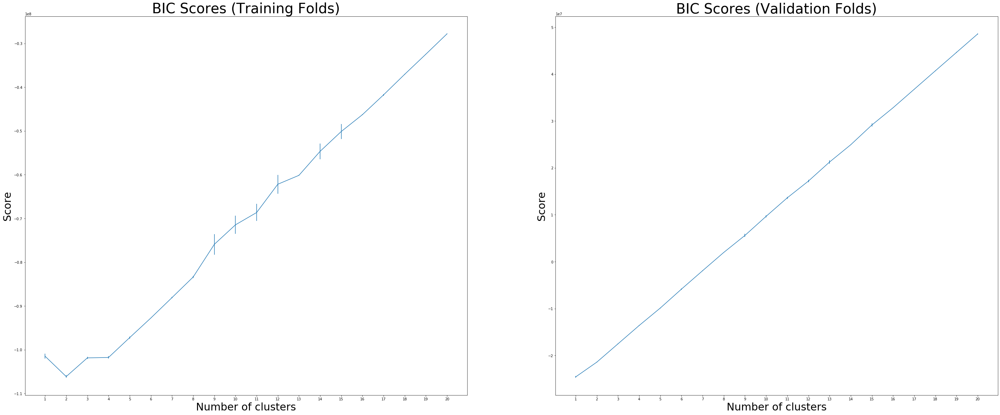

In [0]:
plot_bics_scores(train_bics,valid_bics)

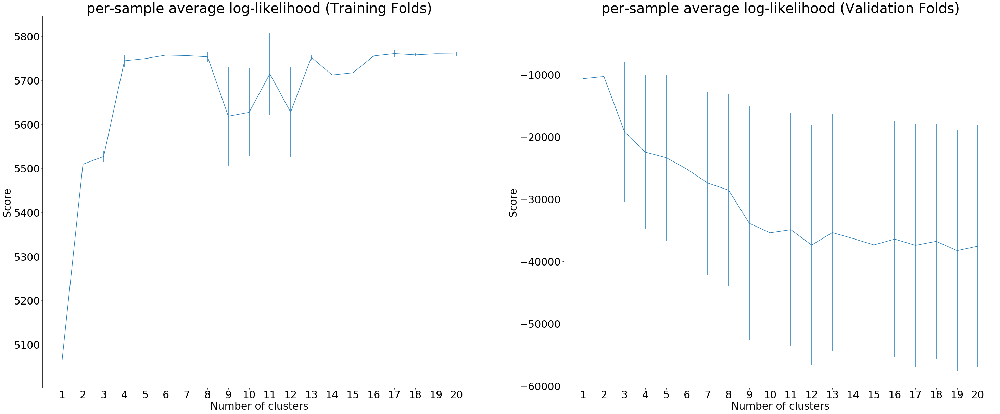

In [0]:
plot_per_sample_log_likelihood(train_scores,valid_scores)

In [0]:
predictions_valid_T = []
predictions_train_T = []
predictions_valid_fitted_T = []

for i in range(5):
  predictions_valid_T.append([])
  predictions_train_T.append([])
  predictions_valid_fitted_T.append([])
  
  
for i in range(20):
  for f in range(5):
    predictions_valid_T[f].append(predictions_valid[i][f])
    predictions_train_T[f].append(predictions_train[i][f])
    predictions_valid_fitted_T[f].append(predictions_valid_fitted[i][f])

# **Prediction Strength of GMM with k clusters**

- compute the co-membership matrix of bursts falling into same clusters after assigning clusters based on nearest centroids calculated on training set clusters
- compare clusters computed on validation dataset with clusters computed by nearest centroids based on comembership 
- measure how well the centroids of training data predict spectral cluster labels of the validation set


In [0]:
from itertools import combinations_with_replacement

def get_co_membership_matrix(labels):
    """ Construct co-membership matrix 
        Args:
            labels (list): list length n containing labels of clusters for each datapoint  

        Returns:
            co_membership_matrix (nd.array): nxn matrix with pairwise information of comembership in clusters of all data points 
    """
    n = len(labels)
    co_membership_matrix = np.zeros((n,n))
    
    for i, label in enumerate(np.unique(labels)): # for each cluster 
        cluster_i = np.where(labels == label)[0] # get bursts of class_i 
        combinations = combinations_with_replacement(cluster_i,2) #indicate bursts i,j falling into the same cluster by assigning 1 to entry [i,j] and [j,i] in co-membership-matrix
        for ij in combinations:
            co_membership_matrix[ij[0], ij[1]] = 1
            co_membership_matrix[ ij[1], ij[0]] = 1
    
    return co_membership_matrix

In [0]:
from sklearn.neighbors.nearest_centroid import NearestCentroid
def calculate_centroids_and_predict_validation_data(train_data,train_labels, valid_data): 
  """ Calculate centroids of each cluster found in training data and assign labels to validation data based on nearest centroid 
    Args:
        train_data (nd.array): Matrix containing training data
        train_labels (list): List of cluster labels for each data point in trainig set
        valid_data (nd.array): Matrix containing validation data   

    Returns:
        centroids (list of nd.arrays): list containing centroids for each cluster (index corresponds to cluster)
        labels_predicted (list): list containing the cluster labels assigned to validation data based on centroids 
    """
  clf = NearestCentroid(metric = "euclidean")
  clf.fit(train_data, train_labels) # calculate centroid for each cluster in training data 
  labels_predicted = clf.predict(valid_data) # label validation data based on centroids
  centroids = clf.centroids_
  
  return centroids, labels_predicted

In [0]:
from itertools import permutations
def calculate_prediction_strength(labels_fitted,labels_centroid, unique_labels):
  """ Calculate prediction strength for each cluster  
    Args:
        labels_fitted (list): labels found by separately clustering of validation data 
        labels_centroid (list): labels found by assignend labels to validation data based on cluster centroids found by clustering training data
        unique_labels (list): list of unique labels  
  
    Returns:
        cluster_prediction_strengths (list): list of prediction strenghts for each cluster 
    """

  #unique_labels = range(n_clusters)
  A_valid_indices = [np.where(labels_fitted == i)[0] for i in unique_labels] # get indices for each clusters in validation data
  n_valid_clusters = [len(A) for A in A_valid_indices] # get size of each cluster 
  co_membership_matrix_centroids = get_co_membership_matrix(labels_centroid) # compute co-membership for validation data labeld by nearest centroid 
  
  cluster_prediction_strengths = []
  for c in unique_labels:
    
    A_i = A_valid_indices[c] # cluster_i indices
    
    co_membership_sum = 0
    for ij in permutations(A_i,2): # get each pair of different bursts in cluster 
      co_membership_sum += co_membership_matrix_centroids[ij[0],ij[1]]
    
    if n_valid_clusters[c] == 0 or  n_valid_clusters[c] -1 == 0: # no or only one burst in class
      prediction_sterngth_c = 0
    else:
      prediction_sterngth_c = 1/(n_valid_clusters[c]*(n_valid_clusters[c]-1)) * co_membership_sum # prediction strength for cluster_i weighted by cluster size
    cluster_prediction_strengths.append(prediction_sterngth_c)
  return cluster_prediction_strengths

In [0]:
def cross_valdation_prediction_strength(data, train_folds, valid_folds, train_fold_labels, valid_fold_labels, valid_fold_labels_predicted_precomputed = None, eigenvector_space_centroids = False, train_eigenvectors = None, valid_eigenvectors=None):
    """ Calculate prediction strength for each cluster and each fold in cross validation  
    Args:
        data (nd.array): Array containing data (n x m)
        train_folds (list of nd.arrays): list of k training set indices each with dimension n-(n/k) x m
        valid_folds (list of nd.arrays): list of k validation set indices each with dimension n/k x m
        train_fold_labels (list of lists): list of lists containing the cluster labels for each point in training set
        valid_fold_labels (list of lists): list of lists containing the cluster labels for each point in validation set
        valid_fold_labels_predicted_precomputed (list of lists): list of lists containing the predicted cluster labels for each point in validation set based on the training set   
    
    Returns:
        predictions_strengths_cv (list of lists): list of lists containing the prediction strenghts for each cluster in clustering with k clusters for each fold (e.g for k ranging from 1 to 20 n_folds X 20 X 1...20)
                                                   1.dim: n-folds  2.dim:. n-clusters 3.dim: prediction strength for each cluster i 
        valid_fold_labels_predicted (list of lists): list of lists containing the cluster labels assigned to validation data based on centroids in clustering with k clusters for each fold 
    """

    n_clusters = len(train_fold_labels[0])
    k_folds = len(train_folds)
    valid_fold_labels_predicted = []
    
    predictions_strengths_cv = [] # 1.dim: k-folds  2.dim:. n-clusters 3.dim: prediction strength for each cluster i 
    
    for k in range(k_folds): # for each fold 
        print("Calculate Predictions Strength for %d. Fold" % (k+1))
        
        if eigenvector_space_centroids:
            print("Calculate Prediction Strength based on Eigenvector Space representation!")
            
            training_set = train_eigenvectors[k] # training set for fold k splitting
            valid_set = valid_eigenvectors[k] # validation set for fold k splitting
        
        else:
            print("Calculate Prediction Strength based on raw Data bursts!")
            
            training_set = data[train_folds[k]] # training set for fold k splitting
            valid_set = data[valid_folds[k]] # validation set for fold k splitting
        
        train_labels = train_fold_labels[k] # labels for training set  
        valid_labels = valid_fold_labels[k] # labels for validation set 
        
        if valid_fold_labels_predicted_precomputed:
            valid_labels_predicted = valid_fold_labels_predicted_precomputed[k]
        else:      
            valid_labels_predicted = []
        
        predictions_strengths_k = [] # prediction strength for fold k 
        
        for c in range(n_clusters): # for each clustering with 1 up to n_clusters 
        
            # labels for clustering with c clsuters 
            train_labels_c = train_labels[c] 
            valid_labels_c = valid_labels[c] 
            
            
            if eigenvector_space_centroids: 
                U_train = training_set[:,:c+1]
                U_train = U_train.astype("float")
                T_train = sklearn.preprocessing.normalize(U_train, norm='l2') 
                training_set = T_train

                U_valid = valid_set[:,:c+1]
                U_valid = U_valid.astype("float")
                T_valid = sklearn.preprocessing.normalize(U_valid, norm='l2') 
                valid_set = T_valid
                
            
            if valid_fold_labels_predicted_precomputed:
                labels_predicted_c = valid_labels_predicted[c]
            
            else:
                if c > 0:
                    centroids_c, labels_predicted_c = calculate_centroids_and_predict_validation_data(training_set,train_labels_c, valid_set) # calculate centroids
                else:
                    labels_predicted_c = np.zeros(len(valid_set))
            
            
            cluster_prediction_strengths = calculate_prediction_strength(valid_labels_c,labels_predicted_c, np.sort(np.unique(train_labels_c))) # list of predictions strengths for each cluster i in c clusters
            predictions_strengths_k.append(cluster_prediction_strengths)
            if not(valid_fold_labels_predicted_precomputed):
                valid_labels_predicted.append(labels_predicted_c)
        
        predictions_strengths_cv.append(predictions_strengths_k)
        valid_fold_labels_predicted.append(valid_labels_predicted)
    
    return predictions_strengths_cv, valid_fold_labels_predicted

In [0]:
def calculate_prediction_strength_per_k(predictions_strengths_cv,valid_fold_labels,valid_fold_labels_predicted, strength_sorted = True):
  """ Calculate prediction strength for each cluster and each fold in cross validation  
    Args:
        predictions_strengths_cv (list of lists): list of lists containing the prediction strenghts for each cluster in clustering with k clusters for each fold (e.g for k ranging from 1 to 20 n_folds X 20 X 1...20)
                                                   1.dim: n-folds  2.dim:. n-clusters 3.dim: prediction strength for each cluster i 
        valid_fold_labels (list of lists): list of lists containing the cluster labels for each point in validation set
        valid_fold_labels_predicted (list of lists): list of lists containing the cluster labels assigned to validation data based on centroids in clustering with k clusters for each fold 
        strength_sorted (bool): If true sort cluster according to prediction strenght in descending order 
    
    Returns:
        k_predictions_strength_cv (dict): Dictonary containig for each clustering with n_clusters the prediction strength for each cluster in each fold 
                                          keys = n_clusters  values = folds x n_clusters 
        k_valid_fold_labels_predicted (dict): containing for each clustering with n_cluster the validation set labels predicted by training set centroids for each fold
                                              keys = n_clusters  values = k_folds x n labels for each point in validation set

        k_valid_fold_labels (dict): containing for each clustering with n_cluster the validation set labels by separately clustering the validation set for each fold
                                    keys = n_clusters  values = k_folds x n labels for each point in validation set

        valid_cluster_size (dict): containing for each clustering with n_cluster the cluster size of the separately clustered validation set for each fold
                                  keys = n_clusters  values = k_folds x size for each cluster 
        
        valid_cluster_size_predicted (dict): containing for each clustering with n_cluster the cluster size of the centroid assigned validation set clusters for each fold
                                             keys = n_clusters  values = k_folds x size for each cluster 
    """

  k_predictions_strength_cv = {}
  k_valid_fold_labels_predicted = {}
  k_valid_fold_labels = {}
  valid_cluster_size = {}
  valid_cluster_size_predicted = {}


  for i in range(1,len(predictions_strengths_cv[0])+1): # for each clustering ranging from 1 to max n_clusters 
    k_predictions_strength_cv[i] = []
    k_valid_fold_labels_predicted[i] = []
    k_valid_fold_labels[i] = []
    valid_cluster_size[i] = []
    valid_cluster_size_predicted[i] = []

  for i, fold in enumerate(predictions_strengths_cv): # for each fold
    for j,k in enumerate(fold): # for each clustering j with k clusters 

      k_valid_fold_labels_predicted[j+1].append(valid_fold_labels_predicted[i][j])
      k_valid_fold_labels[j+1].append(valid_fold_labels[i][j])  

      valid_cluster_size_c = []
      valid_cluster_size_c_predicted = []
      for c in range(len(k)):#np.sort(np.unique(valid_fold_labels[i][j])):#range(j+1):
        cluster_size = len(np.where(valid_fold_labels[i][j] == c)[0])
        cluster_size_predicted = len(np.where(valid_fold_labels_predicted[i][j] == c)[0])
        valid_cluster_size_c.append(cluster_size)
        valid_cluster_size_c_predicted.append(cluster_size_predicted)

      strength_and_size = list(zip(np.round(k, 2), valid_cluster_size_c))
      strength_and_size_predicted = list(zip(np.round(k, 2), valid_cluster_size_c_predicted))
      
      if strength_sorted:
        strength_and_size = sorted(strength_and_size, key=lambda e: (e[0], e[1]),reverse = True)
        strength_and_size_predicted = sorted(strength_and_size_predicted, key=lambda e: (e[0], e[1]), reverse = True)

      k_predictions_strength_cv[j+1].append(np.asarray(strength_and_size)[:,0])

      valid_cluster_size[j+1].append(np.asarray(strength_and_size)[:,1])
      valid_cluster_size_predicted[j+1].append(np.asarray(strength_and_size_predicted)[:,1])
      
  return k_predictions_strength_cv, k_valid_fold_labels_predicted, k_valid_fold_labels, valid_cluster_size, valid_cluster_size_predicted

#GMM

In [0]:
bics = list(np.load('/content/gdrive/My Drive/Burst_data/bics_clusters.npy',allow_pickle=True))
scores = list(np.load('/content/gdrive/My Drive/Burst_data/scores_clusters.npy',allow_pickle=True))
predictions_valid = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_valid_clusters.npy',allow_pickle=True))
predictions_train = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_train_clusters.npy', allow_pickle = True))
predictions_valid_fitted = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_valid_fitted_clusters.npy', allow_pickle = True))

In [0]:
train_folds_gmm = np.load("/content/gdrive/My Drive/Burst_data/train_folds_gmm.npy",allow_pickle=True)
valid_folds_gmm = np.load("/content/gdrive/My Drive/Burst_data/valid_folds_gmm.npy",allow_pickle=True)

In [0]:
predictions_valid_T = []
predictions_train_T = []
predictions_valid_fitted_T = []

for i in range(5):
  predictions_valid_T.append([])
  predictions_train_T.append([])
  predictions_valid_fitted_T.append([])
  
  
for i in range(20):
  for f in range(5):
    predictions_valid_T[f].append(predictions_valid[i][f])
    predictions_train_T[f].append(predictions_train[i][f])
    predictions_valid_fitted_T[f].append(predictions_valid_fitted[i][f])

In [0]:
predictions_strengths_cv_gmm, valid_fold_labels_predicted_gmm = cross_valdation_prediction_strength(dataset_cutted2, train_folds_gmm, valid_folds_gmm, predictions_train_T, predictions_valid_fitted_T)#, valid_fold_labels_predicted_precomputed = predictions_valid_T)

Calculate Predictions Strength for 1. Fold
Calculate Prediction Strength based on raw Data bursts!
Calculate Predictions Strength for 2. Fold
Calculate Prediction Strength based on raw Data bursts!
Calculate Predictions Strength for 3. Fold
Calculate Prediction Strength based on raw Data bursts!
Calculate Predictions Strength for 4. Fold
Calculate Prediction Strength based on raw Data bursts!
Calculate Predictions Strength for 5. Fold
Calculate Prediction Strength based on raw Data bursts!


In [0]:
np.save('/content/gdrive/My Drive/Burst_data/predictions_strengths_cv_gmm_centroid', predictions_strengths_cv_gmm)
np.save('/content/gdrive/My Drive/Burst_data/valid_fold_labels_predicted_gmm_centroid', valid_fold_labels_predicted_gmm)

In [0]:
predictions_strengths_cv_gmm = np.load("/content/gdrive/My Drive/Burst_data/predictions_strengths_cv_gmm_centroid.npy",allow_pickle=True)
valid_fold_labels_predicted_gmm = np.load("/content/gdrive/My Drive/Burst_data/valid_fold_labels_predicted_gmm_centroid.npy",allow_pickle=True)

In [0]:
k_predictions_strength_cv_gmm, k_valid_fold_labels_predicted_gmm, k_valid_fold_labels_gmm, valid_cluster_size_gmm, valid_cluster_size_predicted_gmm = calculate_prediction_strength_per_k(predictions_strengths_cv_gmm,predictions_valid_fitted_T,valid_fold_labels_predicted_gmm, strength_sorted = True)

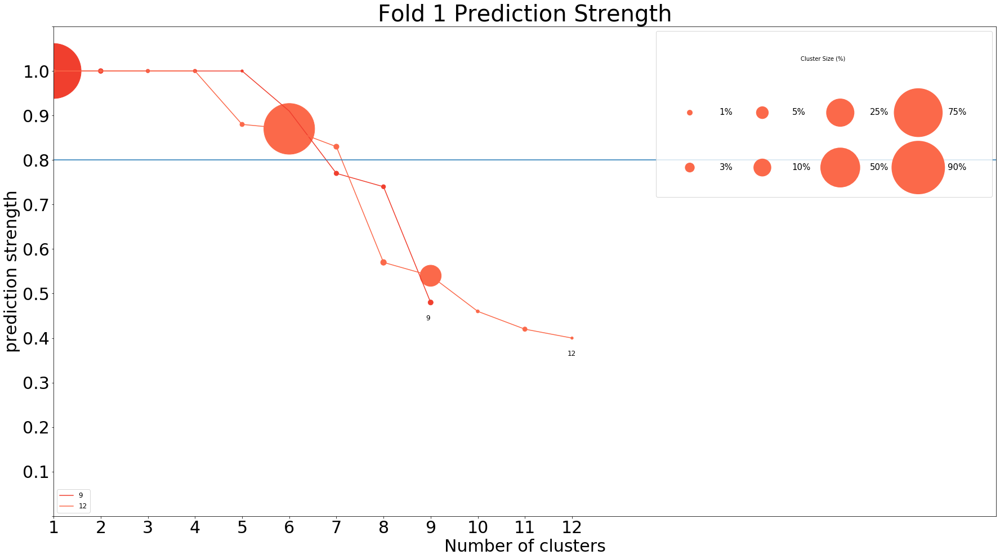

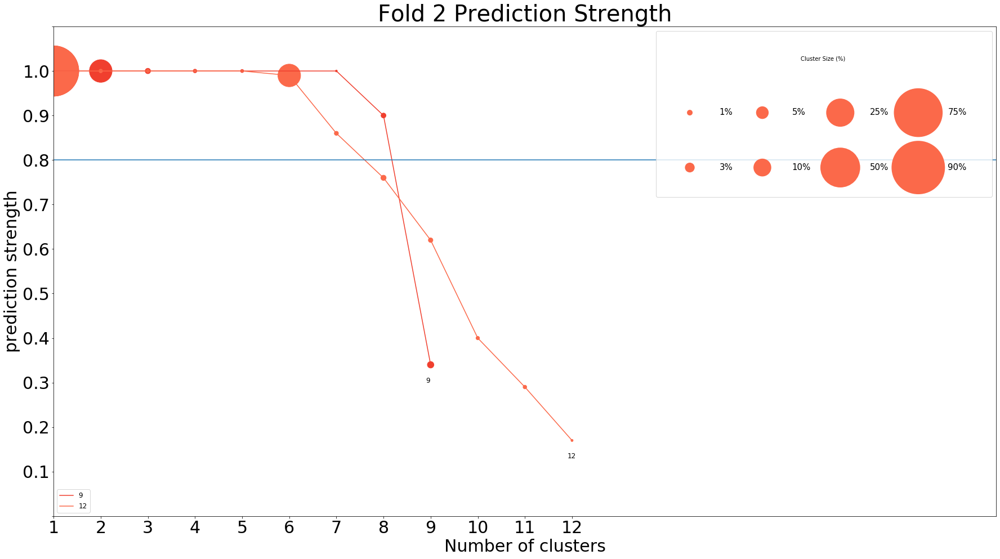

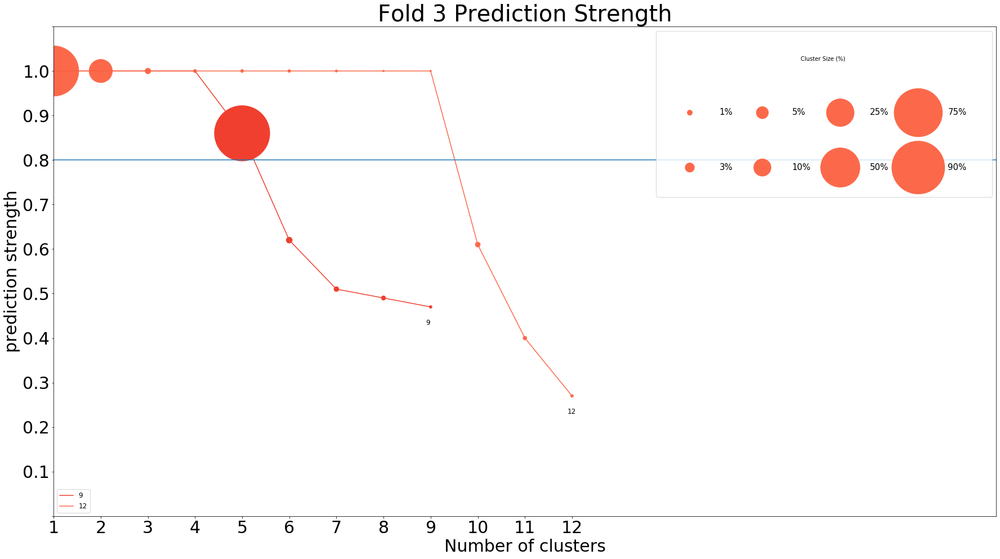

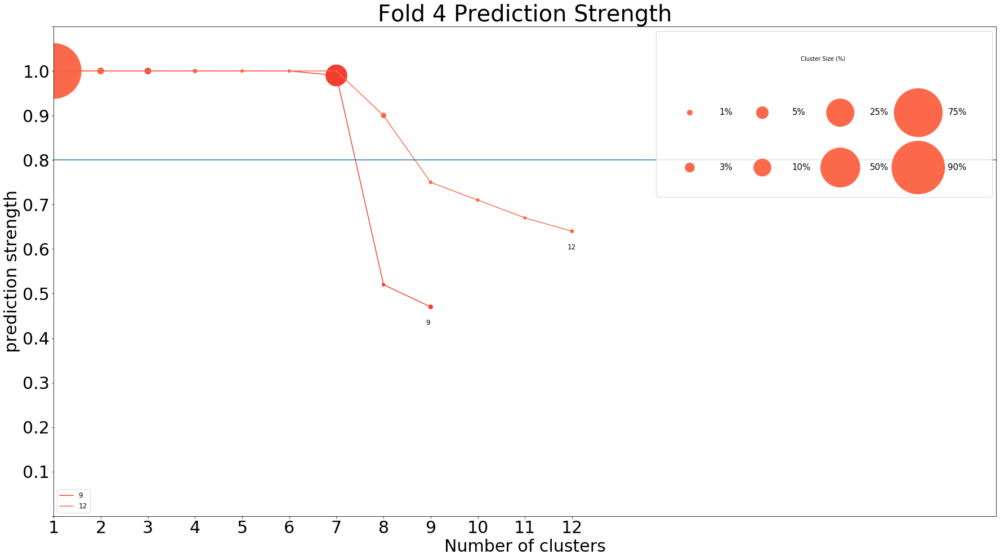

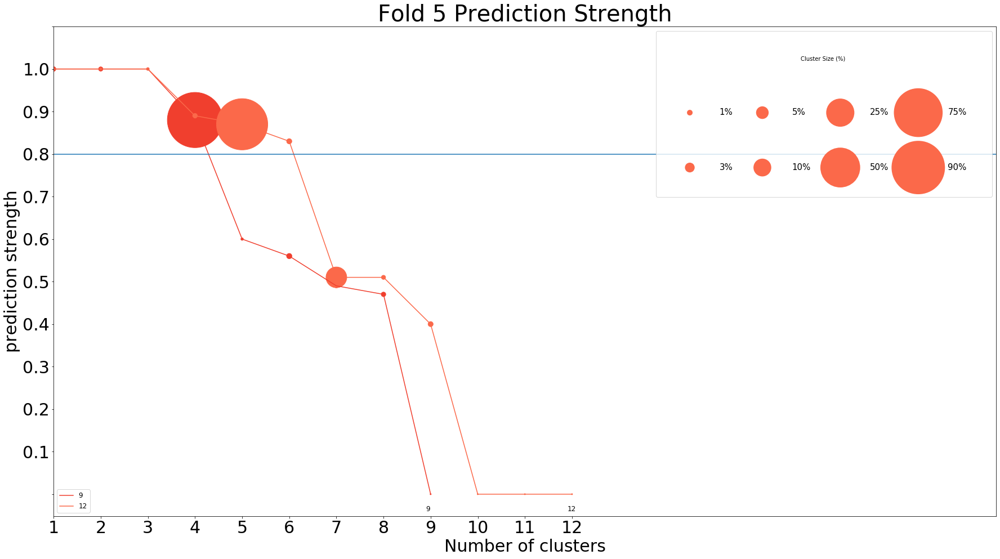

In [0]:
plot_prediction_strength(k_predictions_strength_cv_gmm,valid_cluster_size_gmm,color = sns.color_palette('Reds', 25,)[::-1], n_folds = 5, k_clusters=[9,12])#, k_clusters= [2,3,5,7,9,10,15,20])

Calculate proportion of Bursts from validation set falling into cluster with low prediction strength (below threshold of 0.8) per clustering with k clusters based on


a) clusters found by spectral clustering

b) clusters found by centroid labeling 

In [0]:
def calculate_bad_cluster_sizes_cv(k_predictions_strength_cv, valid_cluster_size,valid_cluster_size_predicted, n_clusters = range(1,21), folds = 5, threshold = 0.8):
    """ Calculate proportion of datapoints from validation set falling into clusters with low prediction strength (below threshold = 0.8) per clustering with k clusters based on:
       a) clustres found by spectral clustering 
       b) clusters bound by centroid labeling based on training dataset

    Args:
        k_predictions_strength_cv (dict): Dictonary containig for each clustering with n_clusters the prediction strength for each cluster in each fold 
                                          keys = n_clusters  values = folds x n_clusters 
        valid_cluster_size (dict): containing for each clustering with n_cluster the cluster size of the separately clustered validation set for each fold
                                  keys = n_clusters  values = k_folds x size for each cluster 
        valid_cluster_size_predicted (dict): containing for each clustering with n_cluster the cluster size of the centroid assigned validation set clusters for each fold
                                             keys = n_clusters  values = k_folds x size for each cluster
        n_clusters (list): list number of k-clusters used in clustering 
        folds (int): number of folds used in cross validation 
        threshold (int): Prediction strength threshold indicating low prediction strength
    
    Returns:
        
        bad_cluster_sizes_cv (dict):  for each clustering with k_cluster proportion of datapoints from validation set falling into clusters with low prediction strength for each fold
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength

        bad_cluster_sizes_cv_predicted (dict):  for each labeling by k_cluster centroids based on training proportion of datapoints from validation set falling into clusters with low prediction strength for each fold
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength
    """

    bad_cluster_sizes_cv = {} 
    bad_cluster_sizes_cv_predicted = {}
    for i in n_clusters:
        bad_cluster_sizes_cv[i] = []
        bad_cluster_sizes_cv_predicted[i] = []

    for f in range(folds):
        for i in n_clusters:
            bad_cluster_idx = np.where(k_predictions_strength_cv[i][f] < threshold) #get index of cluster with prediction strength below 0.8
      
            #get proportion of burst in validation set falling into low predictive strength clusters for clustering with k clusters based on spectral cluster labels
            bad_cluster_sizes = (np.asarray((valid_cluster_size[i])[f]/np.sum(valid_cluster_size[i][f])) * 100)[bad_cluster_idx]  
        
            #get proportion of burst in validation set falling into low predictive strength clusters for clustering with k clusters based on centroid labels
            bad_cluster_sizes_predicted = (np.asarray((valid_cluster_size_predicted[i])[f]/np.sum(valid_cluster_size_predicted[i][f])) * 100)[bad_cluster_idx] # 
        
            bad_cluster_sizes_cv[i].append(list(bad_cluster_sizes))
            bad_cluster_sizes_cv_predicted[i].append(list(bad_cluster_sizes_predicted))
        
    return bad_cluster_sizes_cv, bad_cluster_sizes_cv_predicted

In [0]:
bad_cluster_sizes_cv, bad_cluster_sizes_cv_predicted = calculate_bad_cluster_sizes_cv(k_predictions_strength_cv_gmm, valid_cluster_size_gmm,valid_cluster_size_predicted_gmm)

In [0]:
def calculate_average_bad_cluster_sizes(bad_cluster_sizes_cv, bad_cluster_sizes_cv_predicted, n_clusters = range(1,21), folds = 5):
    """ Calculate average proportion of datapoints from validation set falling into clusters with low prediction strength (below threshold = 0.8) per clustering with k clusters based on:
       a) clustres found by spectral clustering 
       b) clusters bound by centroid labeling based on training dataset

    Args:
        bad_cluster_sizes_cv (dict):  for each clustering with k_cluster proportion of datapoints from validation set falling into clusters with low prediction strength for each fold
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength

        bad_cluster_sizes_cv_predicted (dict):  for each labeling by k_cluster centroids based on training proportion of datapoints from validation set falling into clusters with low prediction strength for each fold
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength
        n_clusters (list): list number of k-clusters used in clustering 
        folds (int): number of folds used in cross validation 
    
    Returns:
        
        average_bad_cluster_size (dict):  for each clustering with k_cluster proportion of datapoints from validation set falling into clusters with low prediction strength averaged by folds
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength

        average_bad_cluster_size_predicted (dict):  for each labeling by k_cluster centroids based on training proportion of datapoints from validation set falling into clusters with low prediction strength averaged by folds
                                      keys = n_clusters  values = k_folds x proportion of datapoints from validation set falling into clusters with low prediction strength
    """



    average_bad_cluster_size = []
    average_bad_cluster_size_predicted = []

    for i in n_clusters:
        bad_cluster_fold_sum = np.sum(sum(bad_cluster_sizes_cv[i],[]))
        bad_cluster_fold_sum_predicted = np.sum(sum(bad_cluster_sizes_cv_predicted[i],[]))

        average_bad_cluster_size.append(bad_cluster_fold_sum/folds)
        average_bad_cluster_size_predicted.append(bad_cluster_fold_sum_predicted/folds)
        
    return average_bad_cluster_size, average_bad_cluster_size_predicted

In [0]:
average_bad_cluster_size, average_bad_cluster_size_predicted = calculate_average_bad_cluster_sizes(bad_cluster_sizes_cv, bad_cluster_sizes_cv_predicted)

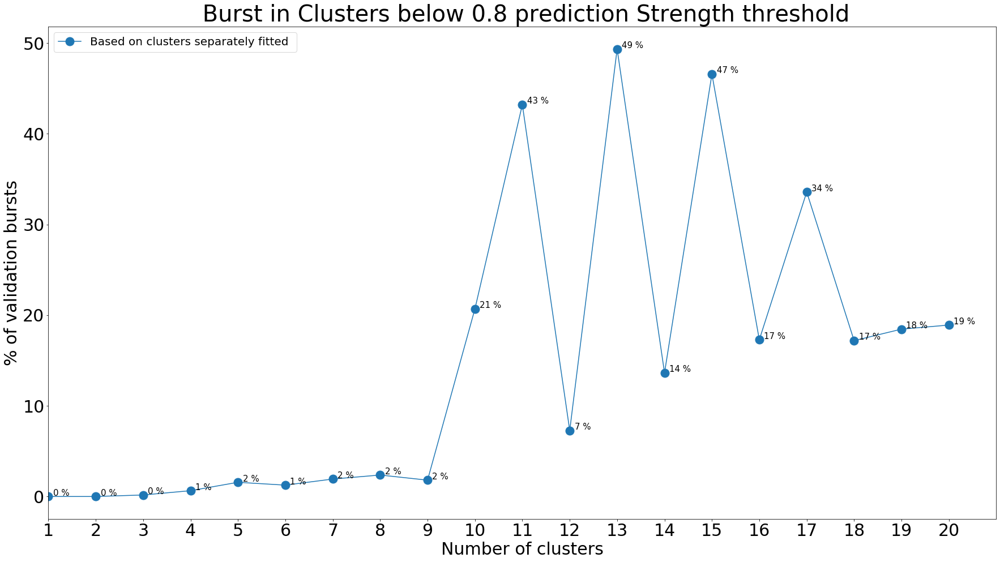

In [0]:
plot_average_proportion_of_bursts_in_low_clusters_per_k(average_bad_cluster_size, average_bad_cluster_size_predicted, n_cluster = range(1,21))

In [0]:
bad_cluster_size_fold = []
bad_cluster_size_predicted_fold = []

for f in range(5):
  bad_cluster_size_f = []
  bad_cluster_size_predicted_f = []
  for i in range(1,21):
    bad_cluster_fold_sum = np.sum(bad_cluster_sizes_cv[i][f])
    bad_cluster_fold_sum_predicted = np.sum(bad_cluster_sizes_cv_predicted[i][f])

    bad_cluster_size_f.append(bad_cluster_fold_sum)
    bad_cluster_size_predicted_f.append(bad_cluster_fold_sum_predicted)
  bad_cluster_size_fold.append(bad_cluster_size_f)
  bad_cluster_size_predicted_fold.append(bad_cluster_size_predicted_f)

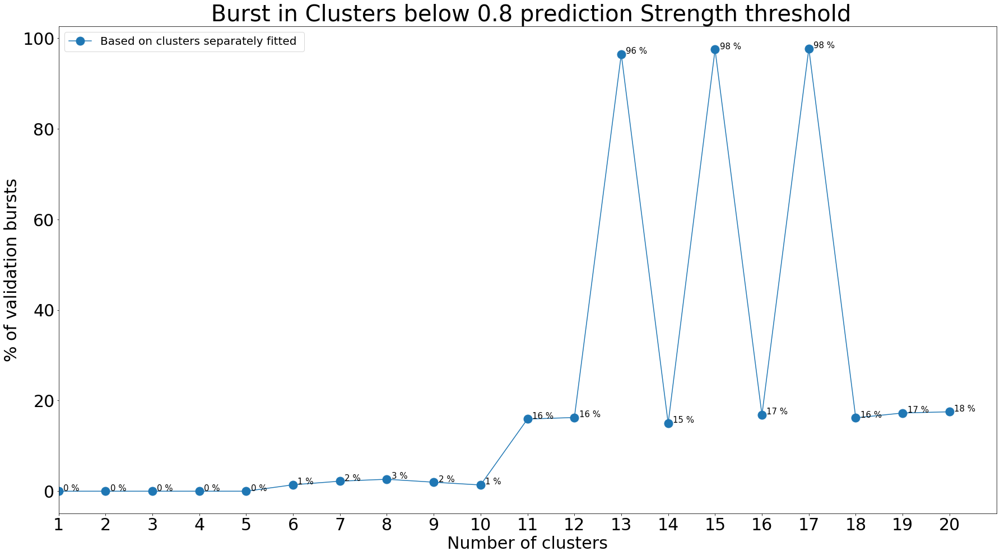

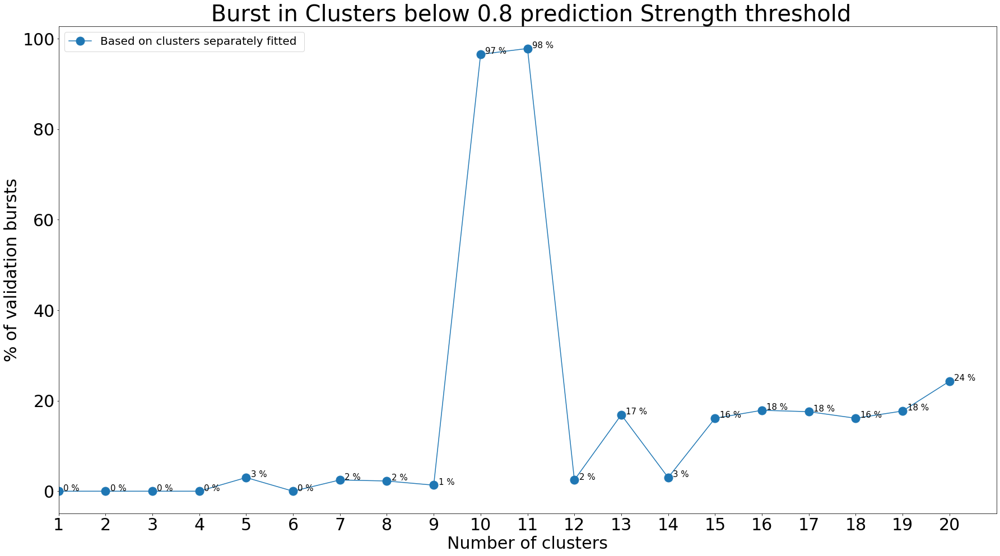

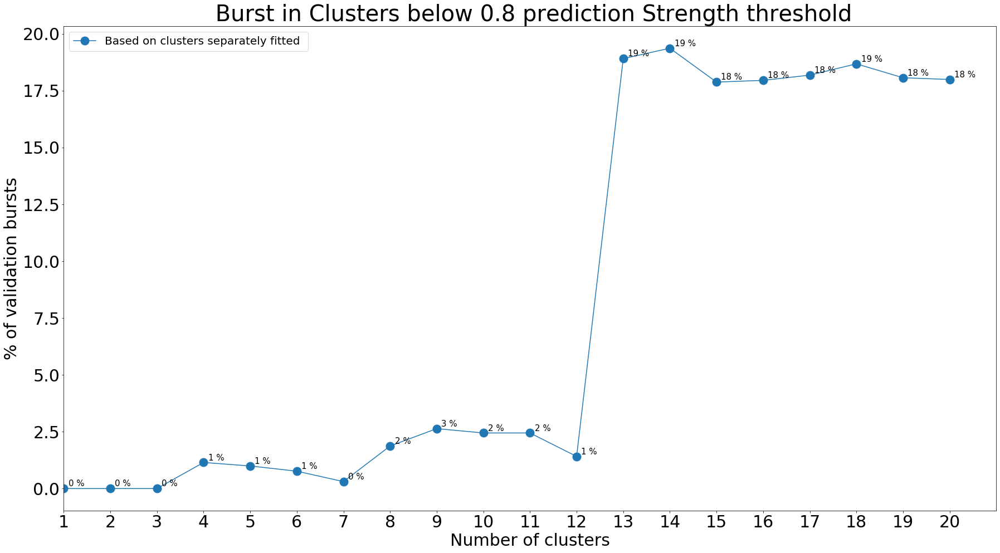

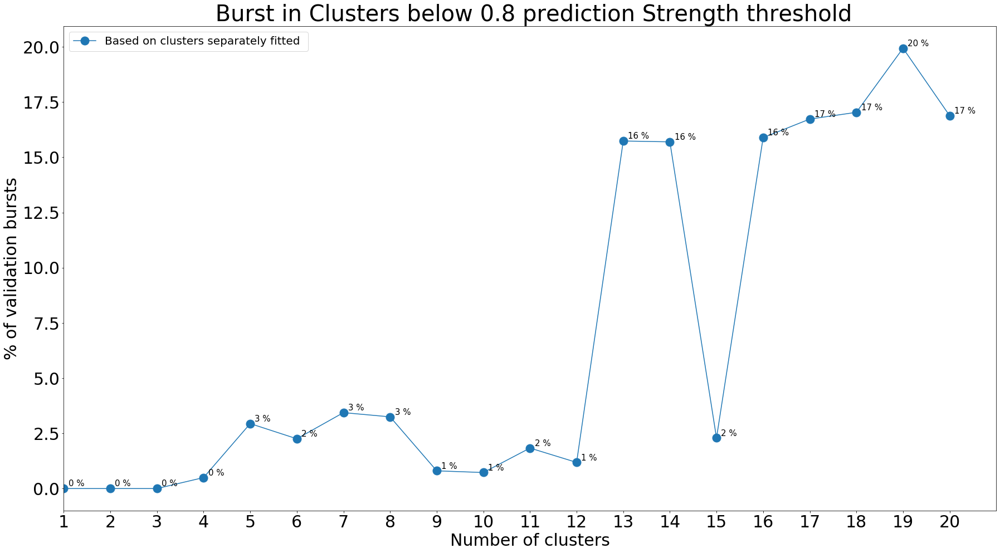

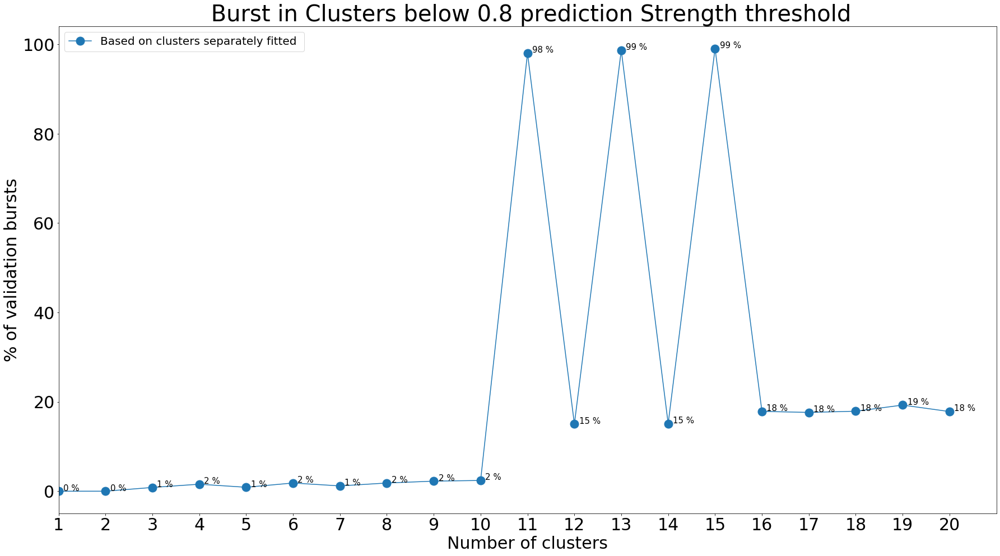

In [0]:
for i in range(5):
  plot_average_proportion_of_bursts_in_low_clusters_per_k(bad_cluster_size_fold[i], bad_cluster_size_predicted_fold[i], n_cluster = range(1,21))

Plot burst examples of each cluster found in validation dataset with k=13 clusters for each fold 


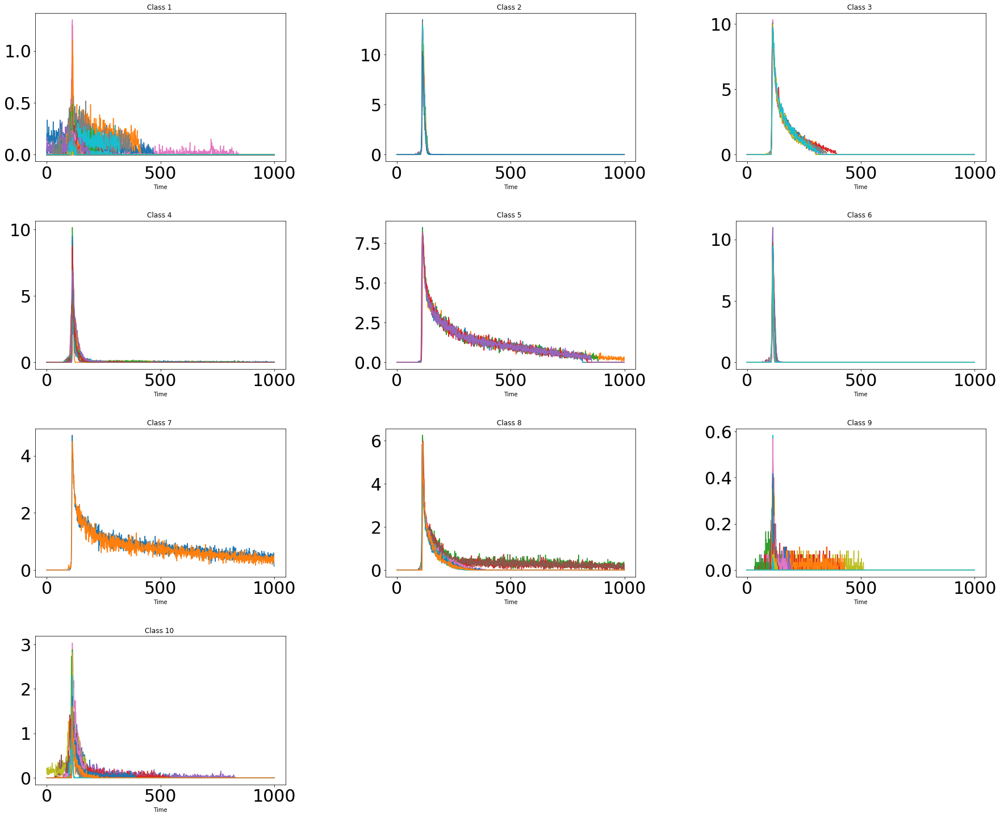

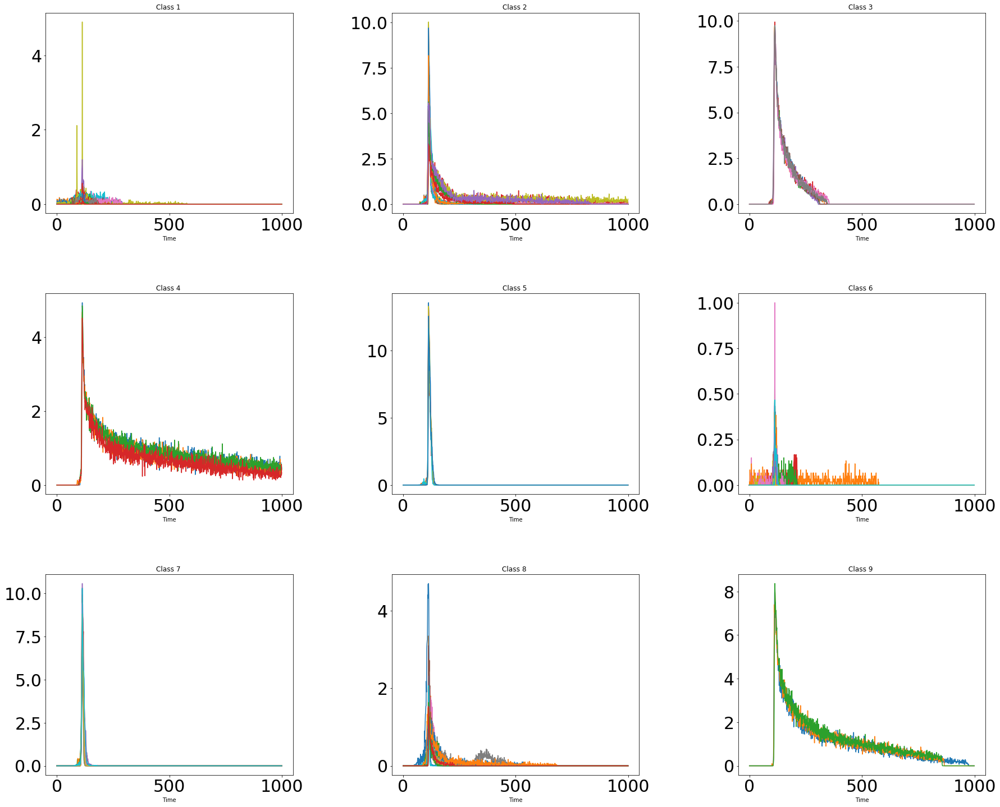

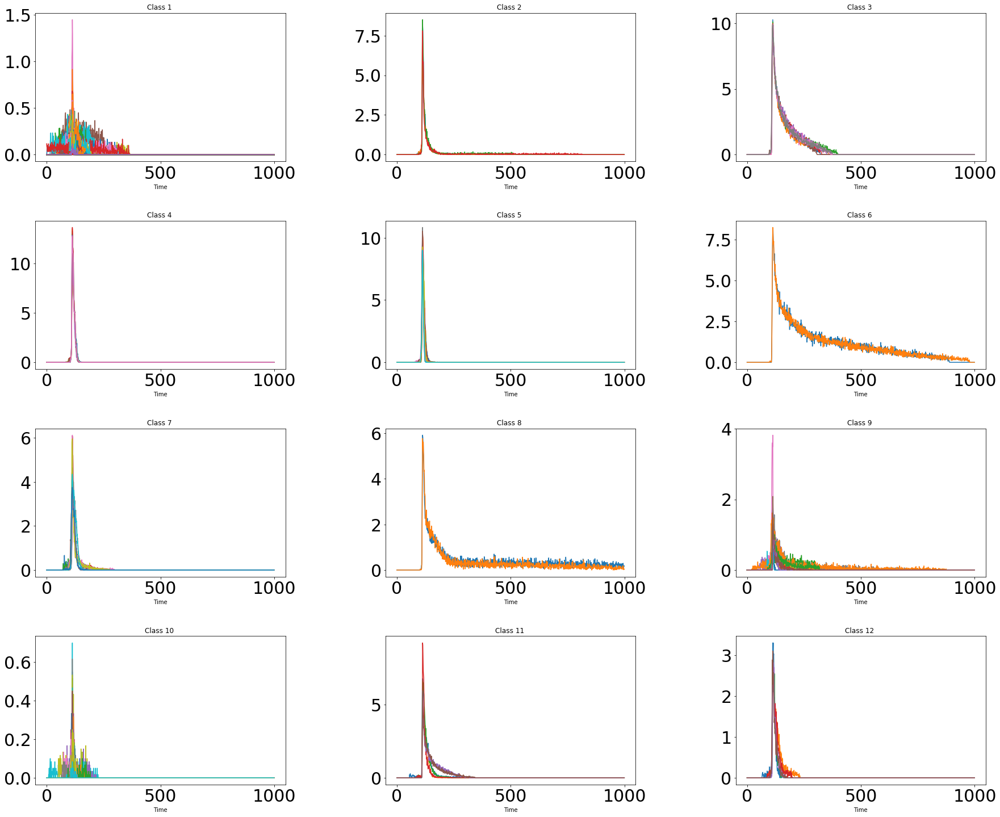

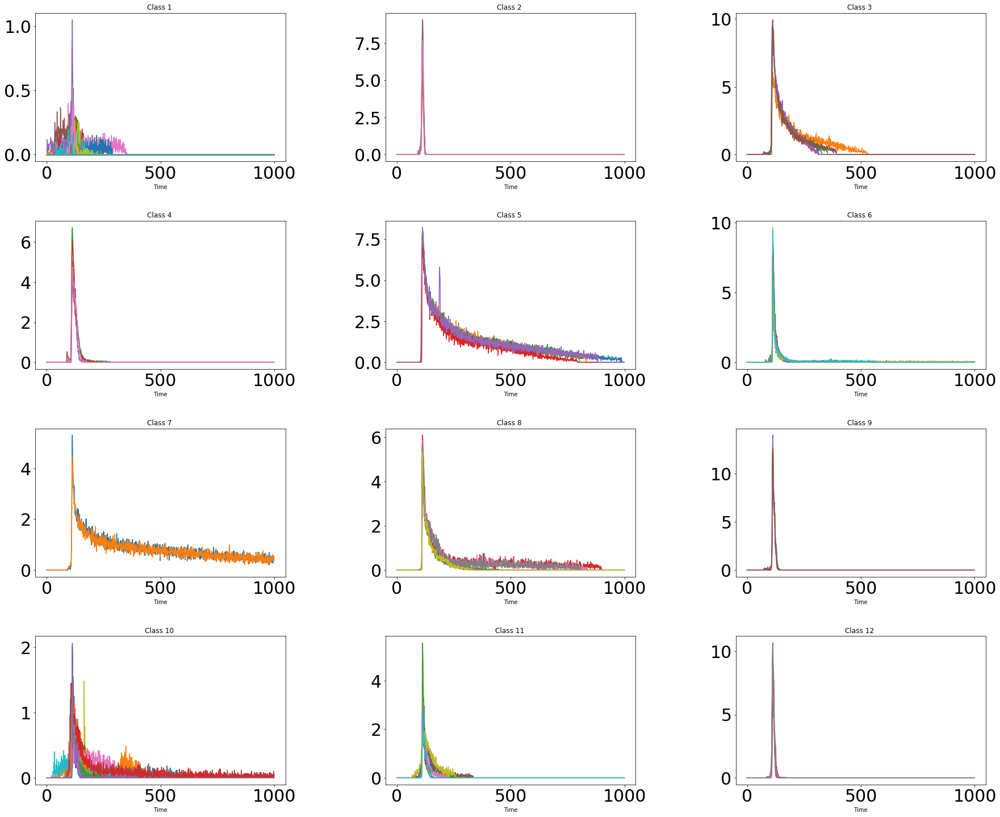

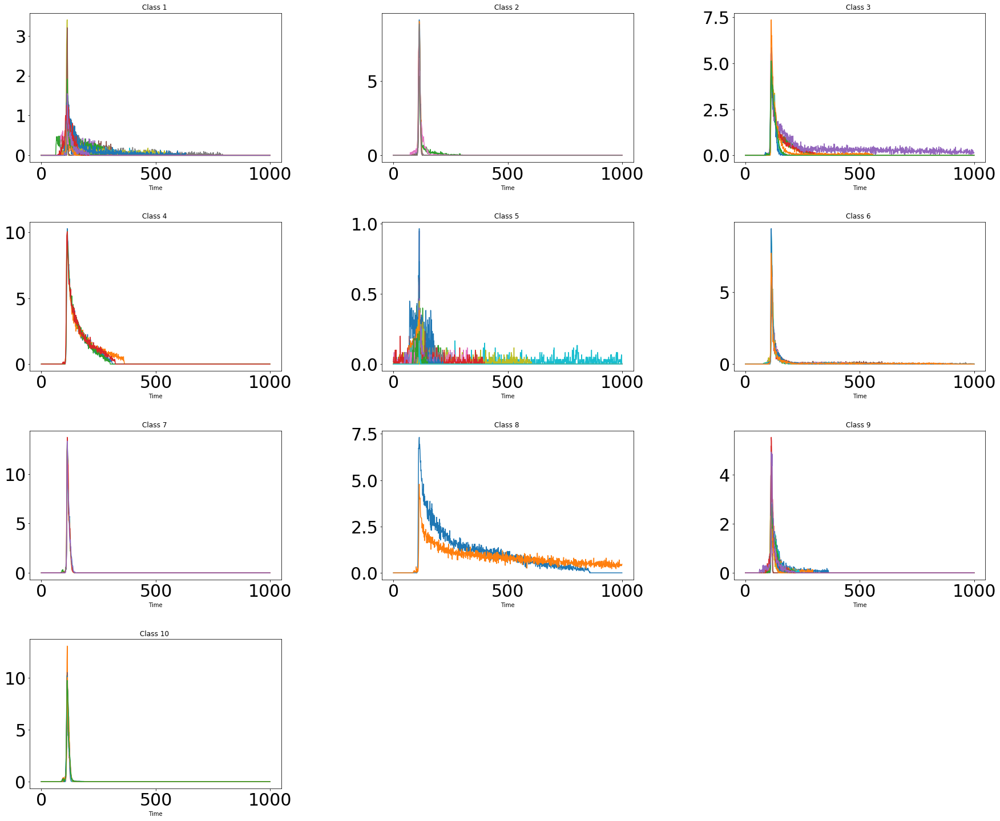

In [0]:
k_clusters_fold = [10,9,12,12,10]
for i in range(5):
  k_clusters =  k_clusters_fold[i]
  fold = i
  training_set = dataset_cutted2[valid_folds_gmm[fold]]

  if k_clusters < 10:
      colors = ["C" + str(i) for i in range(k_clusters)]
  else:
      colors = cm.rainbow(np.linspace(0, 1, k_clusters))

  fig = plt.figure(figsize=(30,25))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)    
  rows = int(np.ceil(k_clusters/3)) 
  for i in range(k_clusters):
      class_i = training_set[np.where(predictions_valid_fitted_T[fold][k_clusters-1] == i)]#dataset_cutted # data_burst_by_time
      class_i = np.random.permutation(class_i)
      if i < k_clusters:
          count = i + 1
      ax = fig.add_subplot(rows, 3, count)
      ax.set_xlabel("Time")
      ax.set_title("Class %i " % (i+1))
      for burst in class_i[0:1000]:
          ax.plot(burst)

# **Denoise Data based on prediction Strength and Refit GMM**
GMM with k=9/k=12 seems to be a turning point in prediction strength. The proportion of bursts falling into cluster with low prediction strength for k=9/k=12 suggest that we have some low predictive clusters with only few bursts, which might be an indicator for clustering "noise". Thats why we want to iteratively remove those bursts falling into low predictive clusters, refit the GMM and see wether we get an overall high prediction strength for fewer clusters. 

In [0]:
def discard_bad_cluster_bursts(k_predictions_strength_cv,valid_folds, valid_fold_labels, train_fold_labels, cs, threshold = 0.8): 
    """ Remove bursts falling into clusters with low prediction strength in order to in some sense denoise the data

    Args:
        k_predictions_strength_cv (dict): Dictonary containig for each clustering with n_clusters the prediction strength for each cluster in each fold 
                                          keys = n_clusters  values = folds x n_clusters 
        valid_folds (list of nd.arrays): list of k validation set indices each with dimension n/k x m
        train_fold_labels (list of lists): list of lists containing the cluster labels for each point in training set
        valid_fold_labels (list of lists): list of lists containing the cluster labels for each point in validation set
        c (int): c (number clusters) used in clustering on which low prediction strength clusters caluclated
        threshold(int): threshold to dertermine bad clusters with low prediction strength
    Returns:
        
        valid_folds_without_bad_clusters (list of nd.arrays): list of k validation set indices after removing indices of bursts falling into clusters with low prediction strength 
        valid_fold_labels_without_bad_clusters (list of lists): list of lists containing the cluster labels for each point in validation set after removing indices of bursts falling into clusters with low prediction strength 
        train_fold_labels_without_bad_clusters (list of lists): list of lists containing the cluster labels for each point in training set after removing indices of bursts falling into clusters with low prediction strength 
        n_bad_clusters_per_fold (list): list of number of clusters below threshold per fold 
    """
    n_bad_clusters_per_fold = []
    valid_folds_without_bad_clusters = []
    valid_fold_labels_without_bad_clusters = []
    train_fold_labels_without_bad_clusters = []
 
    for f in range(len(valid_fold_labels)):
        c = cs[f] #clusters for each fold to calculate number of low prediction strength clusters 
        bad_clusters = np.where(k_predictions_strength_cv[c][f] < threshold)[0]
        n_bad_clusters_per_fold.append(len(bad_clusters))
        valid_fold_i = valid_folds[f]
        valid_labels_i = valid_fold_labels[f][c-1-len(bad_clusters)]
        train_labels_i = train_fold_labels[f][c-1-len(bad_clusters)]
        bad_cluster_indices = []
    
        for bad_cluster in bad_clusters:
            bad_cluster_indices += list(np.where(valid_fold_labels[f][c-1] == bad_cluster)[0])
    
        valid_fold_i = np.delete(valid_fold_i, bad_cluster_indices)
        valid_labels = np.delete(valid_labels_i, bad_cluster_indices)
        valid_folds_without_bad_clusters.append(valid_fold_i)
        valid_fold_labels_without_bad_clusters.append([valid_labels])
        train_fold_labels_without_bad_clusters.append([train_labels_i])
    
    return np.asarray(valid_folds_without_bad_clusters), np.asarray(valid_fold_labels_without_bad_clusters), np.asarray(train_fold_labels_without_bad_clusters), np.asarray(n_bad_clusters_per_fold)

In [0]:
valid_folds_without_bad_clusters, valid_fold_labels_without_bad_clusters, train_fold_labels_without_bad_clusters, n_bad_clusters_per_fold = discard_bad_cluster_bursts(k_predictions_strength_cv_gmm, valid_folds_gmm, predictions_valid_fitted_T, predictions_train_T, [12,12,12,12,12])

In [28]:
init_k_clusters = 12
counter = 5
threshold = 0.8

n_bad_clusters_per_fold = [1,1,1,1,1]


valid_folds_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/valid_folds_denoised_gmm_%d.npy' % (counter - 1),allow_pickle=True))
n_bad_clusters_per_fold = list(np.load('/content/gdrive/My Drive/Burst_data/n_bad_clusters_per_fold_gmm_%d.npy' % (counter - 1),allow_pickle=True))
predictions_train_T_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/train_fold_labels_denoised_gmm_%d.npy' % (counter - 1),allow_pickle=True))
predictions_valid_fitted_T_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/valid_fold_labels_denoised_gmm_%d.npy' % (counter - 1),allow_pickle=True))
predictions_strengths_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_strengths_without_bad_clusters_gmm_%d.npy' % (counter - 1),allow_pickle=True))
valid_fold_labels_without_bad_clusters_predicted = list(np.load('/content/gdrive/My Drive/Burst_data/valid_fold_labels_without_bad_clusters_gmm_%d_predicted.npy' % (counter - 1),allow_pickle=True))

k_predictions_strength_cv_without_bad_clusters, k_valid_fold_labels_predicted_without_bad_clusters, k_valid_fold_labels_without_bad_clusters, valid_cluster_size_without_bad_clusters, valid_cluster_size_predicted_without_bad_clusters = calculate_prediction_strength_per_k(predictions_strengths_without_bad_clusters,predictions_valid_fitted_T_without_bad_clusters,valid_fold_labels_without_bad_clusters_predicted, strength_sorted = True)
prev_k_clusters = np.asarray(list(np.load('/content/gdrive/My Drive/Burst_data/prev_k_clusters_gmm_%d.npy' % (counter - 1),allow_pickle=True)))


while np.sum(n_bad_clusters_per_fold) > 0 or counter == 0:
    if counter == 0:
        k_clusters = np.repeat(init_k_clusters,5)
        valid_folds_without_bad_clusters, valid_fold_labels_without_bad_clusters, train_fold_labels_without_bad_clusters, n_bad_clusters_per_fold = discard_bad_cluster_bursts(k_predictions_strength_cv_gmm, valid_folds_gmm, predictions_valid_fitted_T, predictions_train_T, k_clusters, threshold = threshold)
        prev_k_clusters = k_clusters

    else:     
        k_clusters = prev_k_clusters - n_bad_clusters_per_fold
        valid_folds_without_bad_clusters, valid_fold_labels_without_bad_clusters, train_fold_labels_without_bad_clusters, n_bad_clusters_per_fold = discard_bad_cluster_bursts(k_predictions_strength_cv_without_bad_clusters, valid_folds_without_bad_clusters, predictions_valid_fitted_T_without_bad_clusters, predictions_train_T_without_bad_clusters, k_clusters, threshold = threshold)


    print("Look at [%d,%d,%d,%d,%d] Clusters in each fold!" % tuple(list(k_clusters)))
    print("[%d,%d,%d,%d,%d] Clusters found in each fold with Prediction Strength below threshold = %.2f!" % (tuple(list(n_bad_clusters_per_fold) + [threshold])))
    
    print("Save denoised validation folds!")
    np.save('/content/gdrive/My Drive/Burst_data/valid_folds_denoised_gmm_%d' % counter, valid_folds_without_bad_clusters)
    np.save('/content/gdrive/My Drive/Burst_data/n_bad_clusters_per_fold_gmm_%d' % counter ,n_bad_clusters_per_fold)



    print("Start Fitting GMM !")
    clusters = list(range(1,np.amax(k_clusters-n_bad_clusters_per_fold) + 1))
    print("Fit GMM with up to %d Components for each fold!" % clusters[-1])
    bics, scores, predictions_train_without_bad_clusters, predictions_valid_without_bad_clusters, predictions_valid_fitted_without_bad_clusters = cv_gmm_models(dataset_cutted2,train_folds_gmm,valid_folds_without_bad_clusters,clusters,n_init=10)

    predictions_valid_T_without_bad_clusters = []
    predictions_train_T_without_bad_clusters = []
    predictions_valid_fitted_T_without_bad_clusters = []

    for i in range(5):
        predictions_valid_T_without_bad_clusters.append([])
        predictions_train_T_without_bad_clusters.append([])
        predictions_valid_fitted_T_without_bad_clusters.append([])
  
    for i in range(clusters[-1]):
        for f in range(5):
            predictions_valid_T_without_bad_clusters[f].append(predictions_valid_without_bad_clusters[i][f])
            predictions_train_T_without_bad_clusters[f].append(predictions_train_without_bad_clusters[i][f])
            predictions_valid_fitted_T_without_bad_clusters[f].append(predictions_valid_fitted_without_bad_clusters[i][f])


    print("Save labels!")
    np.save('/content/gdrive/My Drive/Burst_data/train_fold_labels_denoised_gmm_%d' % counter,predictions_train_T_without_bad_clusters)
    np.save('/content/gdrive/My Drive/Burst_data/valid_fold_labels_denoised_gmm_%d' % counter ,predictions_valid_fitted_T_without_bad_clusters)


    print("Calculate Prediction Strength for each fold! ")
    predictions_strengths_without_bad_clusters, valid_fold_labels_without_bad_clusters_predicted = cross_valdation_prediction_strength(dataset_cutted2, train_folds_gmm, valid_folds_without_bad_clusters, predictions_train_T_without_bad_clusters, predictions_valid_fitted_T_without_bad_clusters)
    print("Done!")


    print("Save Prediction Strength!")
    np.save('/content/gdrive/My Drive/Burst_data/predictions_strengths_without_bad_clusters_gmm_%d' % counter , predictions_strengths_without_bad_clusters)
    np.save('/content/gdrive/My Drive/Burst_data/valid_fold_labels_without_bad_clusters_gmm_%d_predicted' % counter, valid_fold_labels_without_bad_clusters_predicted)

    k_predictions_strength_cv_without_bad_clusters, k_valid_fold_labels_predicted_without_bad_clusters, k_valid_fold_labels_without_bad_clusters, valid_cluster_size_without_bad_clusters, valid_cluster_size_predicted_without_bad_clusters = calculate_prediction_strength_per_k(predictions_strengths_without_bad_clusters,predictions_valid_fitted_T_without_bad_clusters,valid_fold_labels_without_bad_clusters_predicted, strength_sorted = True)
    prev_k_clusters = k_clusters
    np.save('/content/gdrive/My Drive/Burst_data/prev_k_clusters_gmm_%d' % counter, prev_k_clusters)

    counter += 1

Look at [4,4,4,5,3] Clusters in each fold!
[0,0,0,0,0] Clusters found in each fold with Prediction Strength below threshold = 0.80!
Save denoised validation folds!
Start Fitting GMM !
Fit GMM with up to 5 Components for each fold!
Fitting GMM with 1 clusters:
On 1 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
On 2 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
On 3 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
On 4 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
On 5 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
Fitting GMM with 2 clusters:
On 1 Fold
Predicting Training Set!
Predicting Validation Set!
Prediction Vlaidation Set after fitting separately!
On 2 Fold
Predicting Traini

In [117]:
init_k_clusters = 12
counter = 6
threshold = 0.8


valid_folds_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/valid_folds_denoised_gmm_%d.npy' % (counter-2),allow_pickle=True))
n_bad_clusters_per_fold = list(np.load('/content/gdrive/My Drive/Burst_data/n_bad_clusters_per_fold_gmm_%d.npy' % (counter - 1),allow_pickle=True))
predictions_train_T_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/train_fold_labels_denoised_gmm_%d.npy' % (counter - 2),allow_pickle=True))
predictions_valid_fitted_T_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/valid_fold_labels_denoised_gmm_%d.npy' % (counter - 2),allow_pickle=True))
predictions_strengths_without_bad_clusters = list(np.load('/content/gdrive/My Drive/Burst_data/predictions_strengths_without_bad_clusters_gmm_%d.npy' % (counter - 2),allow_pickle=True))
valid_fold_labels_without_bad_clusters_predicted = list(np.load('/content/gdrive/My Drive/Burst_data/valid_fold_labels_without_bad_clusters_gmm_%d_predicted.npy' % (counter - 2),allow_pickle=True))

k_predictions_strength_cv_without_bad_clusters, k_valid_fold_labels_predicted_without_bad_clusters, k_valid_fold_labels_without_bad_clusters, valid_cluster_size_without_bad_clusters, valid_cluster_size_predicted_without_bad_clusters = calculate_prediction_strength_per_k(predictions_strengths_without_bad_clusters,predictions_valid_fitted_T_without_bad_clusters,valid_fold_labels_without_bad_clusters_predicted, strength_sorted = True)
prev_k_clusters = np.asarray(list(np.load('/content/gdrive/My Drive/Burst_data/prev_k_clusters_gmm_%d.npy' % (counter - 2),allow_pickle=True)))



print("Look at [%d,%d,%d,%d,%d] Clusters in each fold!" % tuple(list(prev_k_clusters)))
print("[%d,%d,%d,%d,%d] Clusters found in each fold with Prediction Strength below threshold = %.2f!" % (tuple(list(n_bad_clusters_per_fold) + [threshold])))


Look at [4,4,4,5,4] Clusters in each fold!
[0,0,0,0,0] Clusters found in each fold with Prediction Strength below threshold = 0.80!


In [110]:
for i, fold in  enumerate(valid_folds_without_bad_clusters):
    print("Validation fold %d size reduced from %d bursts to %d bursts. Reduction of %.2f %%!" % (i+1, len(valid_folds_gmm[i]), len(fold), np.round((len(valid_folds_gmm[i]) - len(fold))/len(valid_folds_gmm[i]) ,4) * 100))

Validation fold 1 size reduced from 2618 bursts to 2531 bursts. Reduction of 3.32 %!
Validation fold 2 size reduced from 2618 bursts to 459 bursts. Reduction of 82.47 %!
Validation fold 3 size reduced from 2618 bursts to 481 bursts. Reduction of 81.63 %!
Validation fold 4 size reduced from 2618 bursts to 2551 bursts. Reduction of 2.56 %!
Validation fold 5 size reduced from 2620 bursts to 374 bursts. Reduction of 85.73 %!


## Prediction strength after denoising in comparison to prediction strength pre denoising


### After denoising

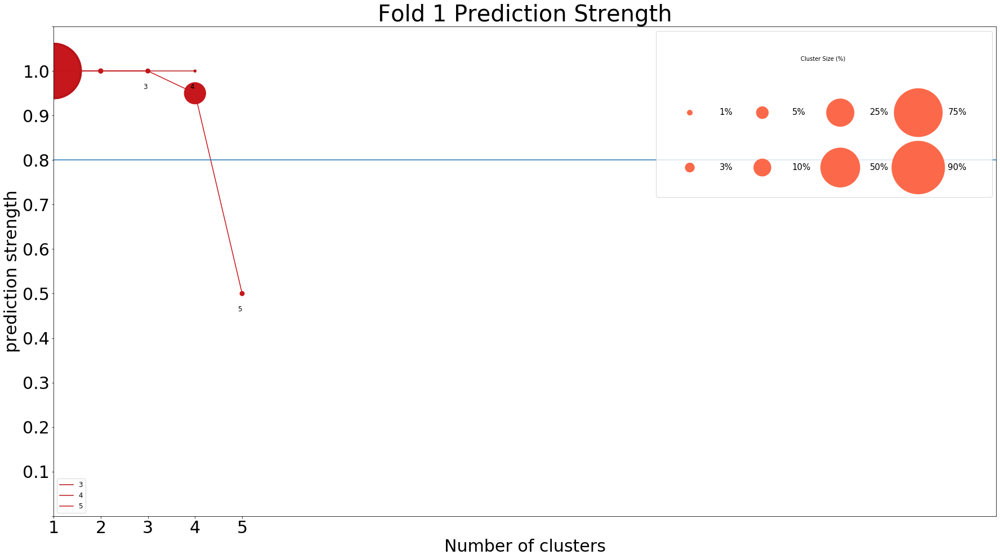

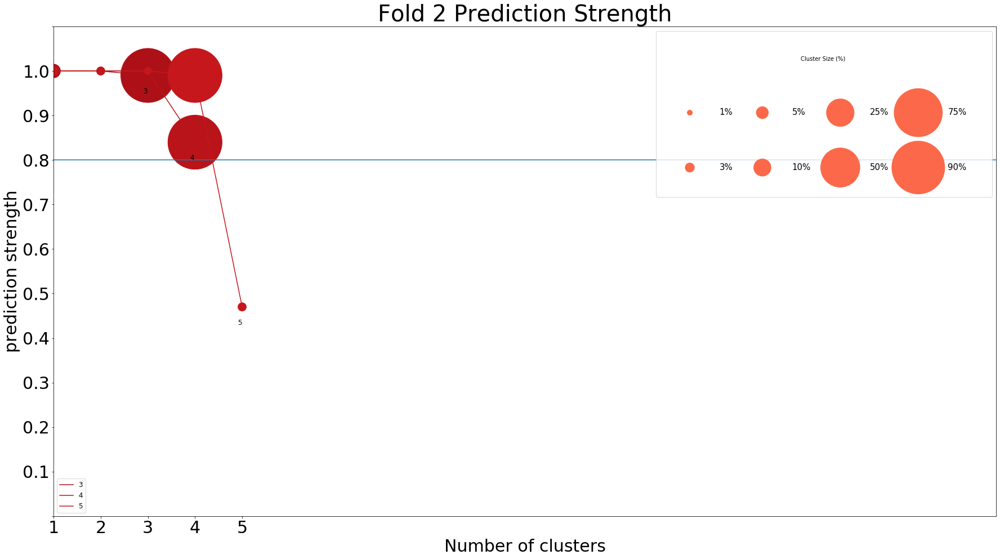

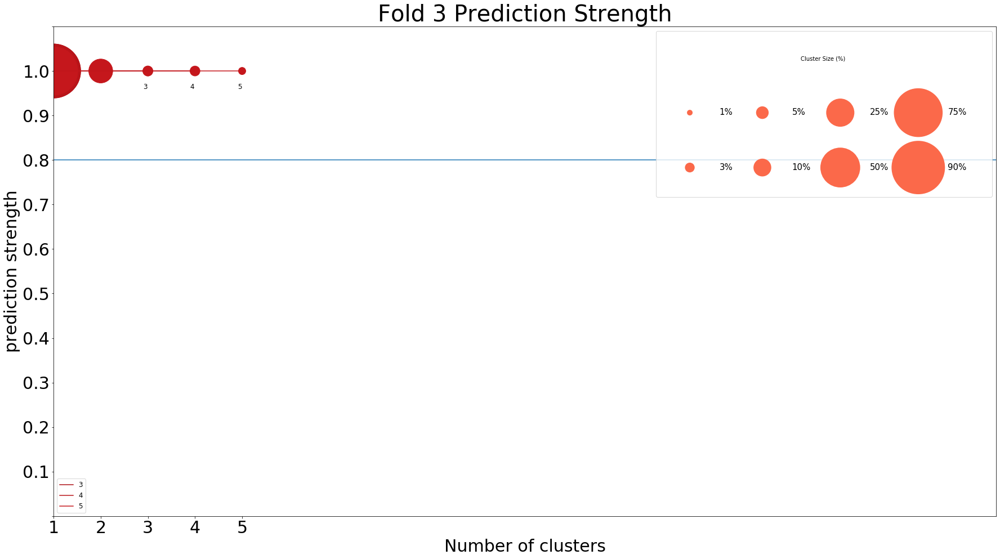

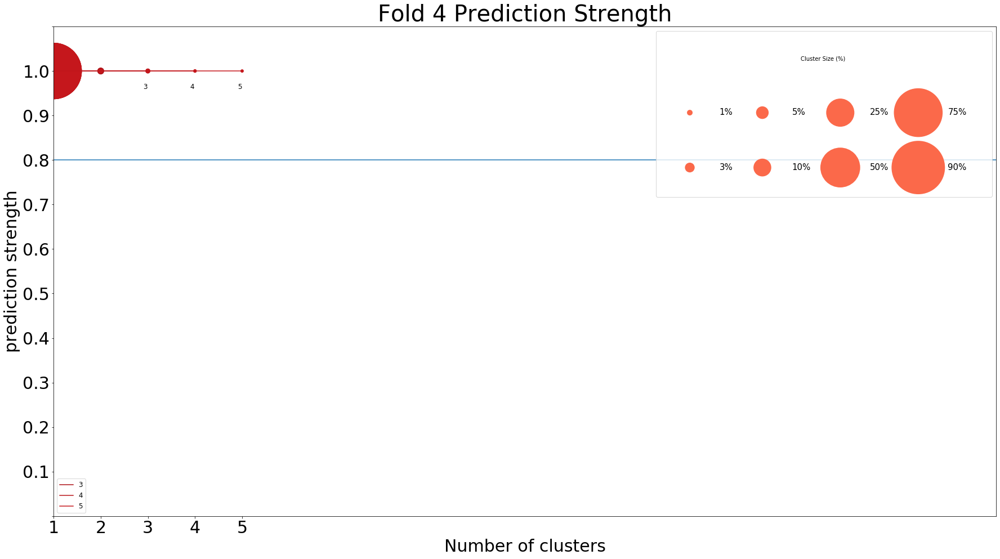

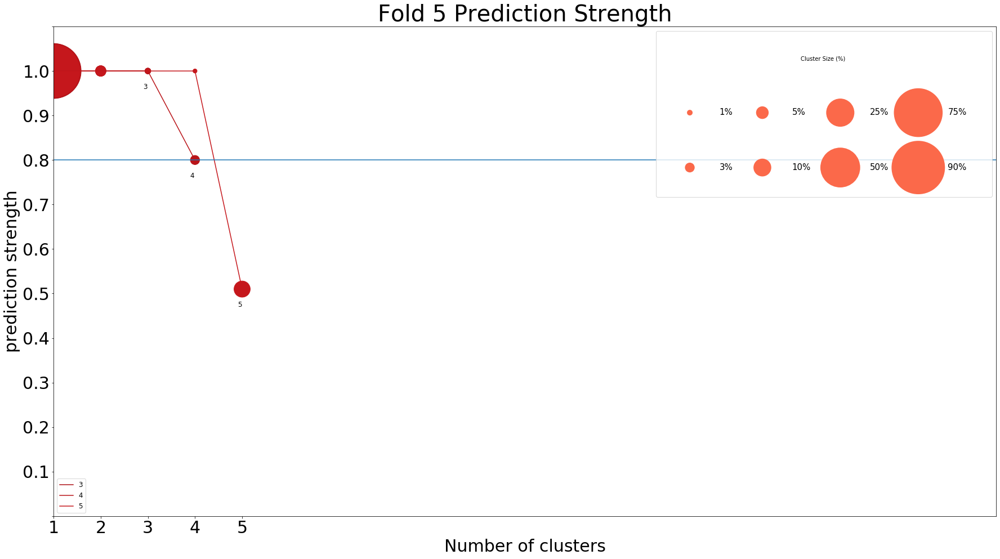

In [113]:
plot_prediction_strength(k_predictions_strength_cv_without_bad_clusters,valid_cluster_size_without_bad_clusters,color = sns.color_palette('Reds', 25,)[::-1], n_folds = 5, k_clusters=[3,4,5])

### Pre denoising

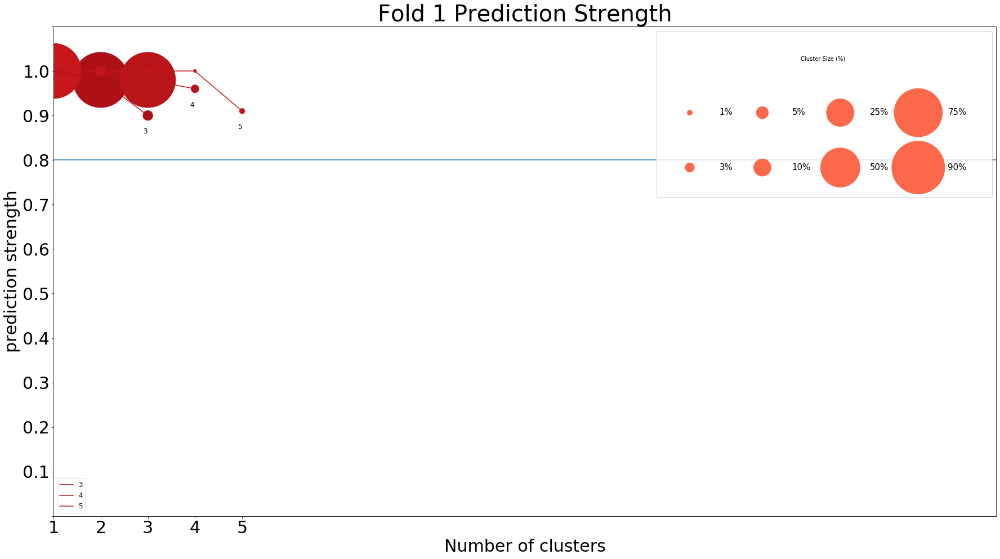

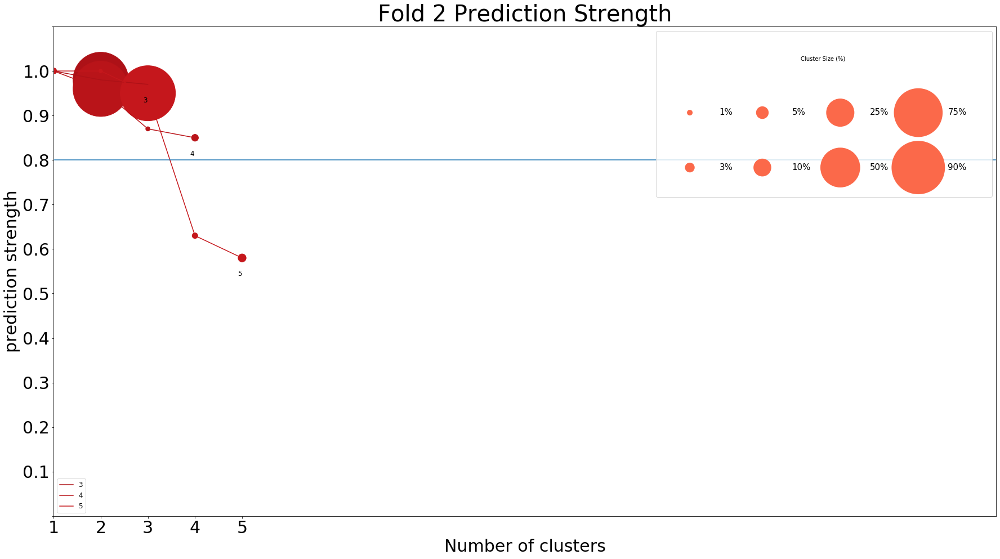

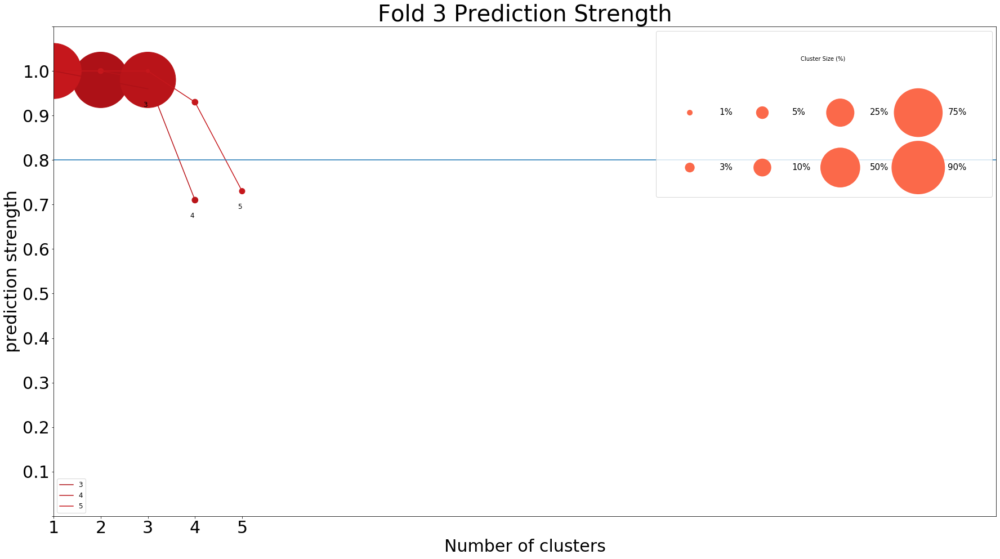

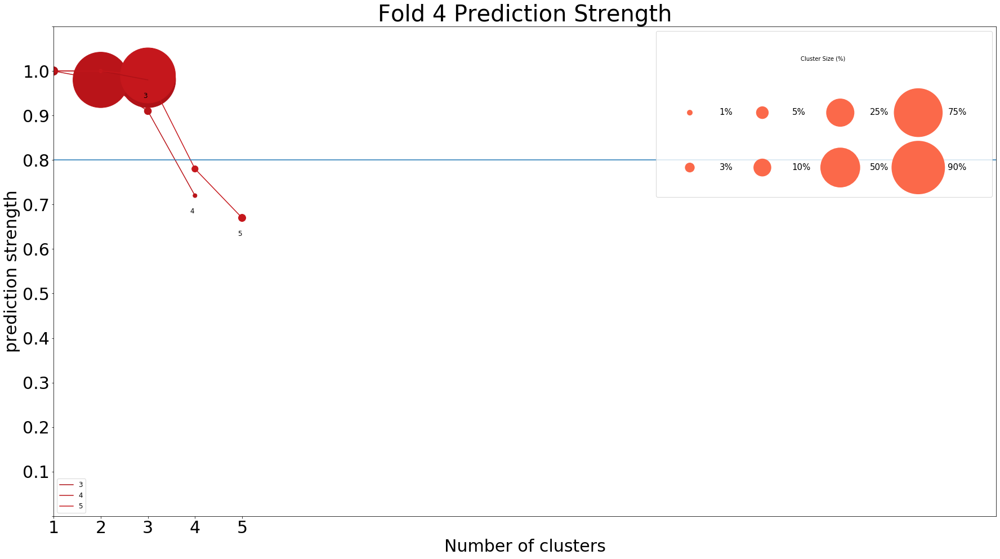

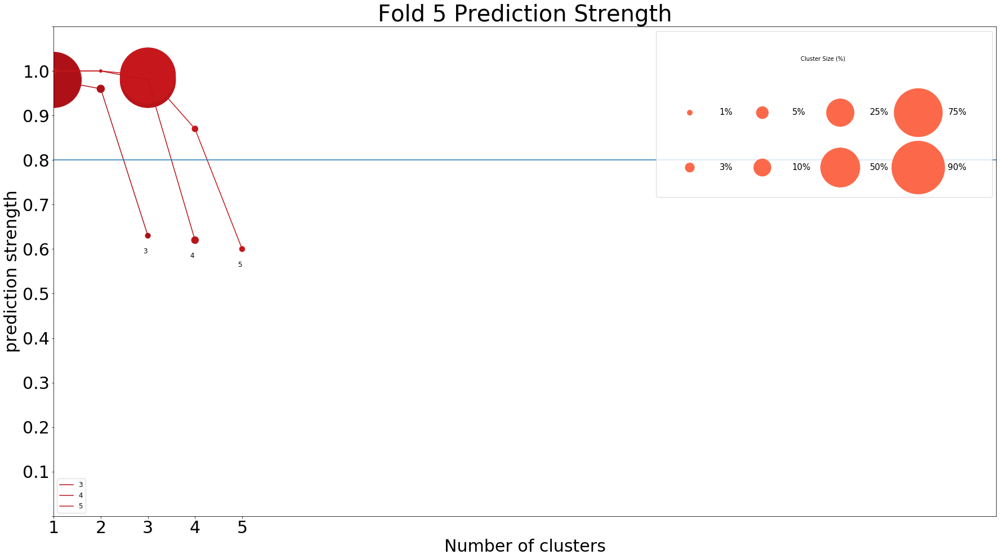

In [119]:
plot_prediction_strength(k_predictions_strength_cv_gmm,valid_cluster_size_gmm,color = sns.color_palette('Reds', 25,)[::-1], n_folds = 5, k_clusters=[3,4,5])

### Cluster Examples after denoising

[4, 4, 5, 5, 4]


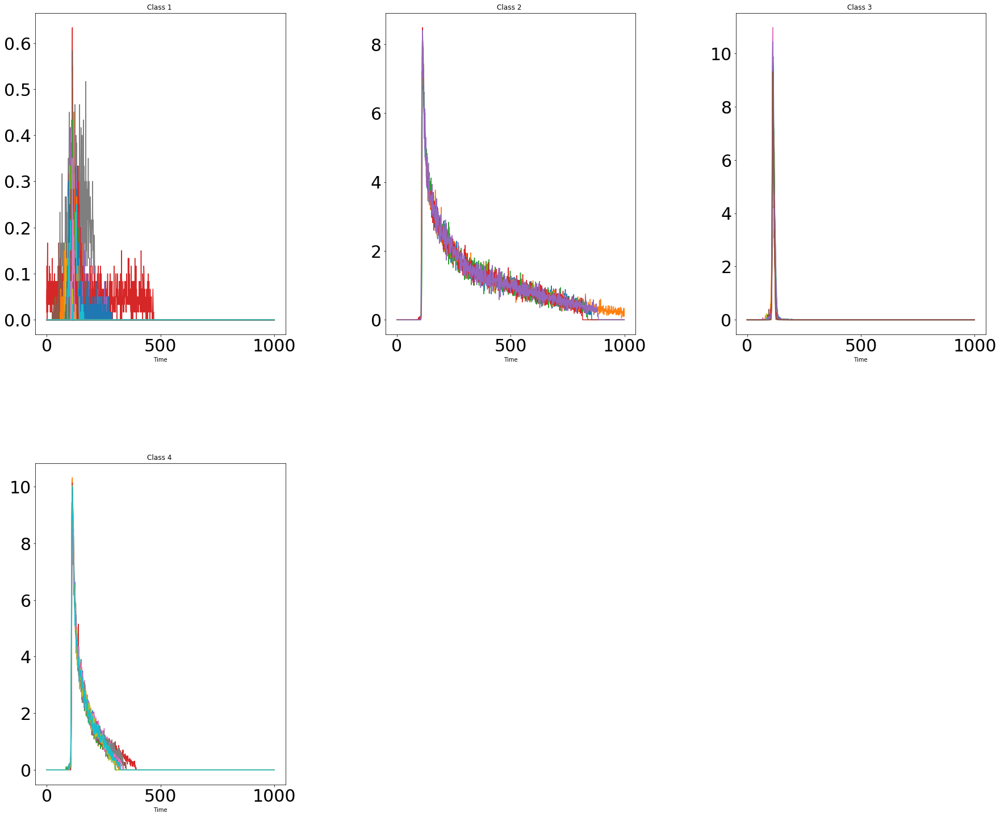

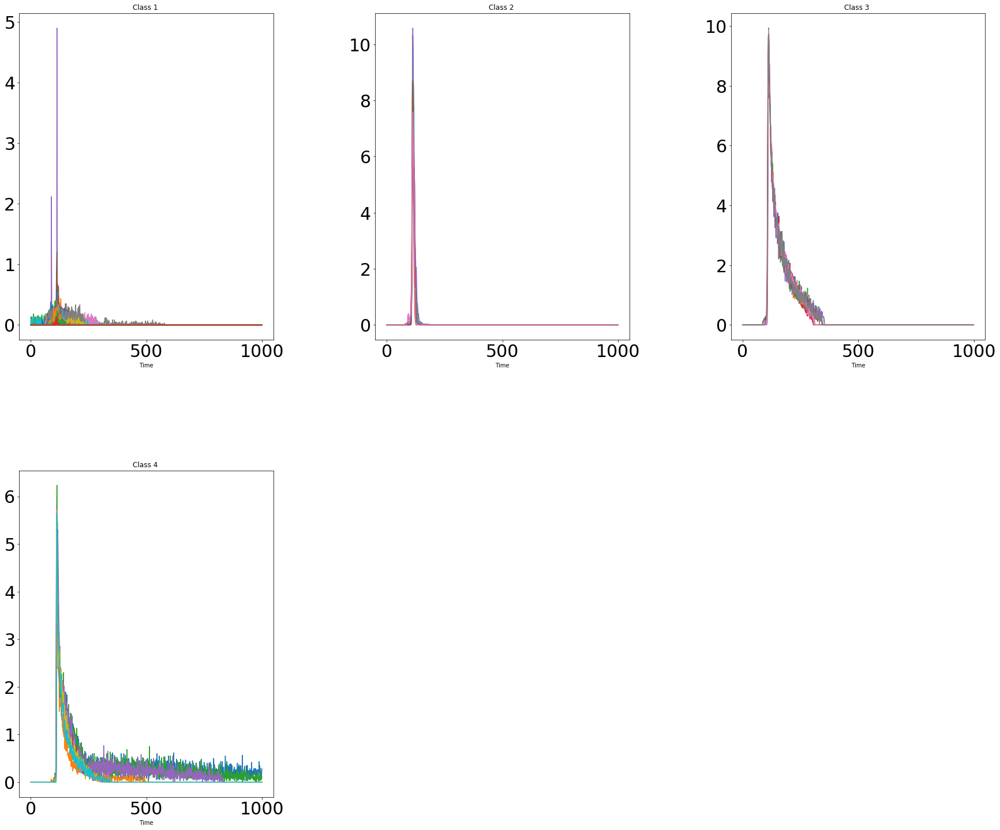

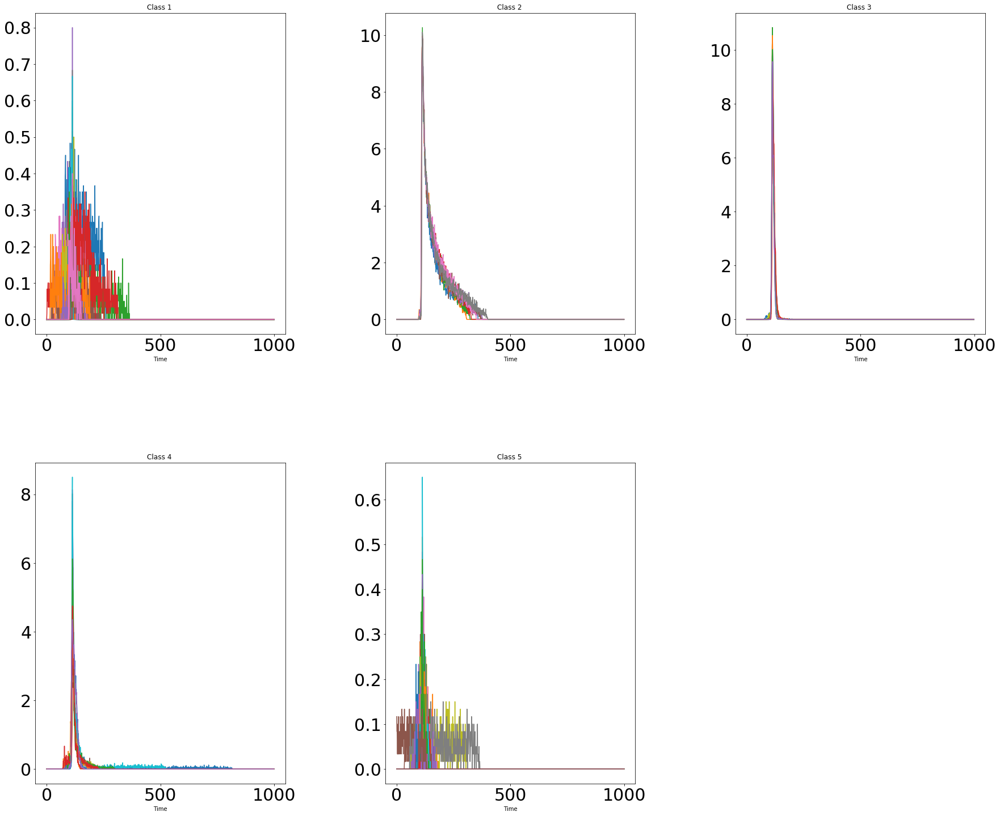

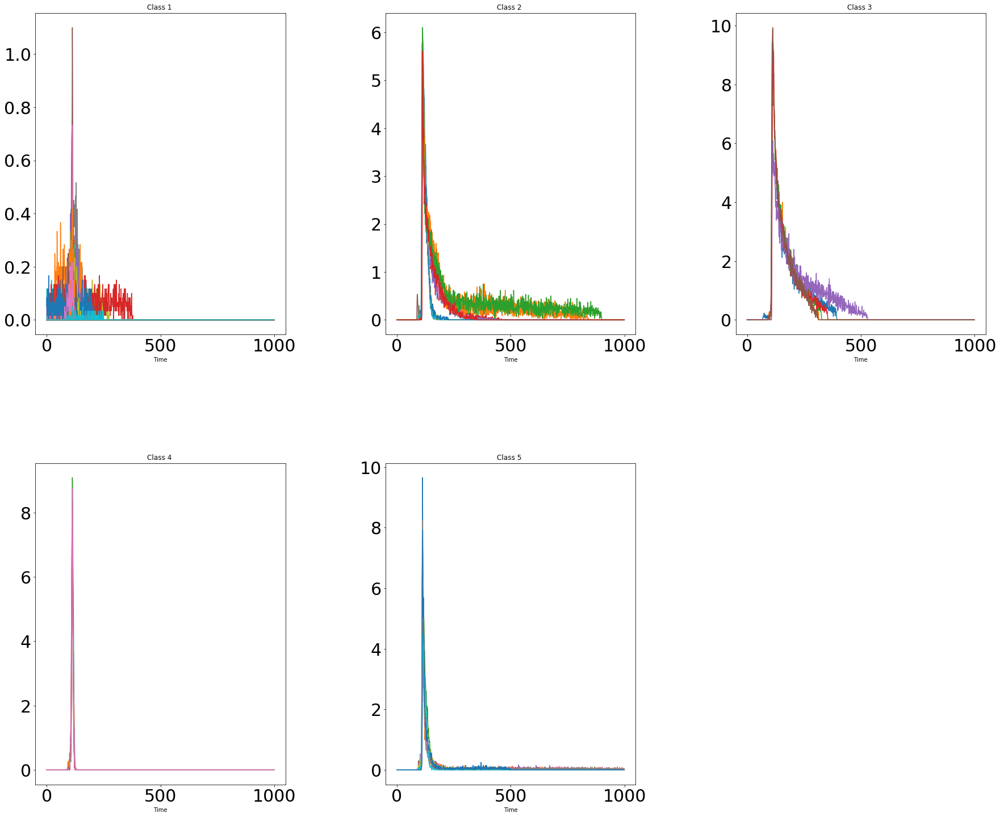

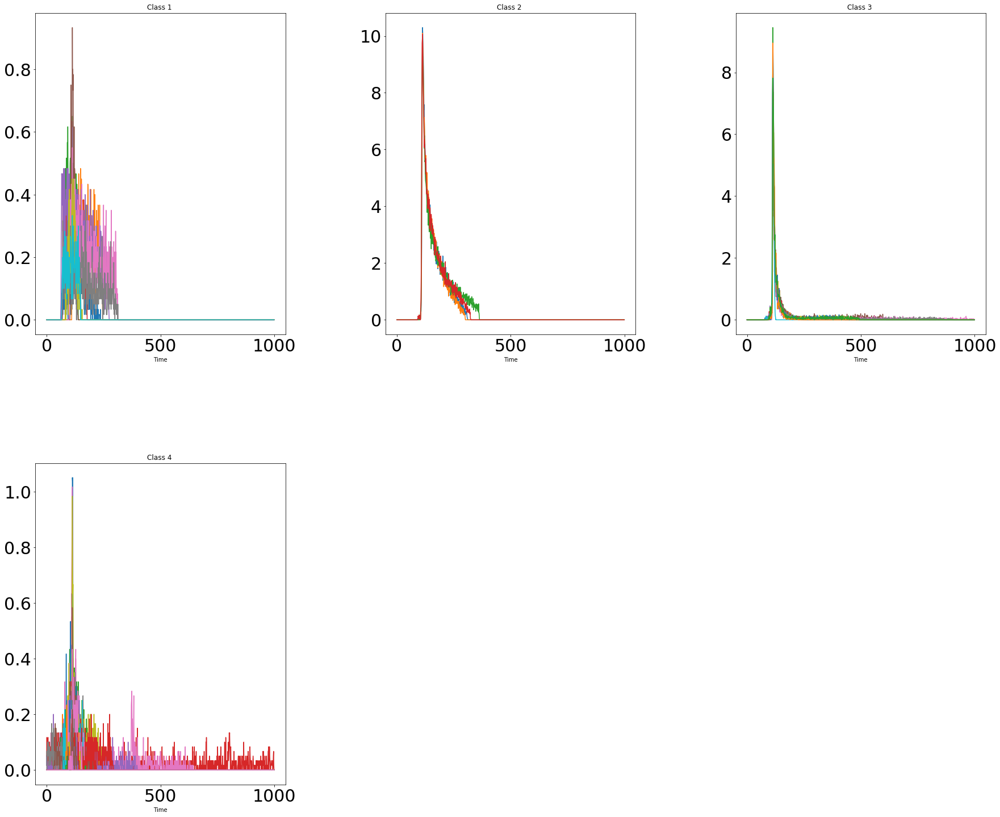

In [121]:
k_clusters_fold = [4,4,5,5,4]
print(k_clusters_fold)
for i in range(5):
  k_clusters =  k_clusters_fold[i]
  fold = i
  training_set = dataset_cutted2[valid_folds_without_bad_clusters[fold]]#[valid_folds_without_bad_clusters[fold]] [valid_folds_gmm[fold]]
  if k_clusters < 10:
      colors = ["C" + str(i) for i in range(k_clusters)]
  else:
      colors = cm.rainbow(np.linspace(0, 1, k_clusters))

  fig = plt.figure(figsize=(30,25))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)    
  rows = int(np.ceil(k_clusters/3)) 
  for i in range(k_clusters):
      class_i = training_set[np.where(predictions_valid_fitted_T_without_bad_clusters[fold][k_clusters-1] == i)] #[np.where(predictions_valid_fitted_T_without_bad_clusters[fold][k_clusters-1] == i)] [np.where(predictions_valid_fitted_T[fold][k_clusters-1] == i)]
      class_i = np.random.permutation(class_i)
      if i < k_clusters:
          count = i + 1
      ax = fig.add_subplot(rows, 3, count)
      ax.set_xlabel("Time")
      ax.set_title("Class %i " % (i+1))
      for burst in class_i[0:1000]:
          ax.plot(burst)

### Cluster Examples pre denoising

[4, 4, 5, 5, 4]


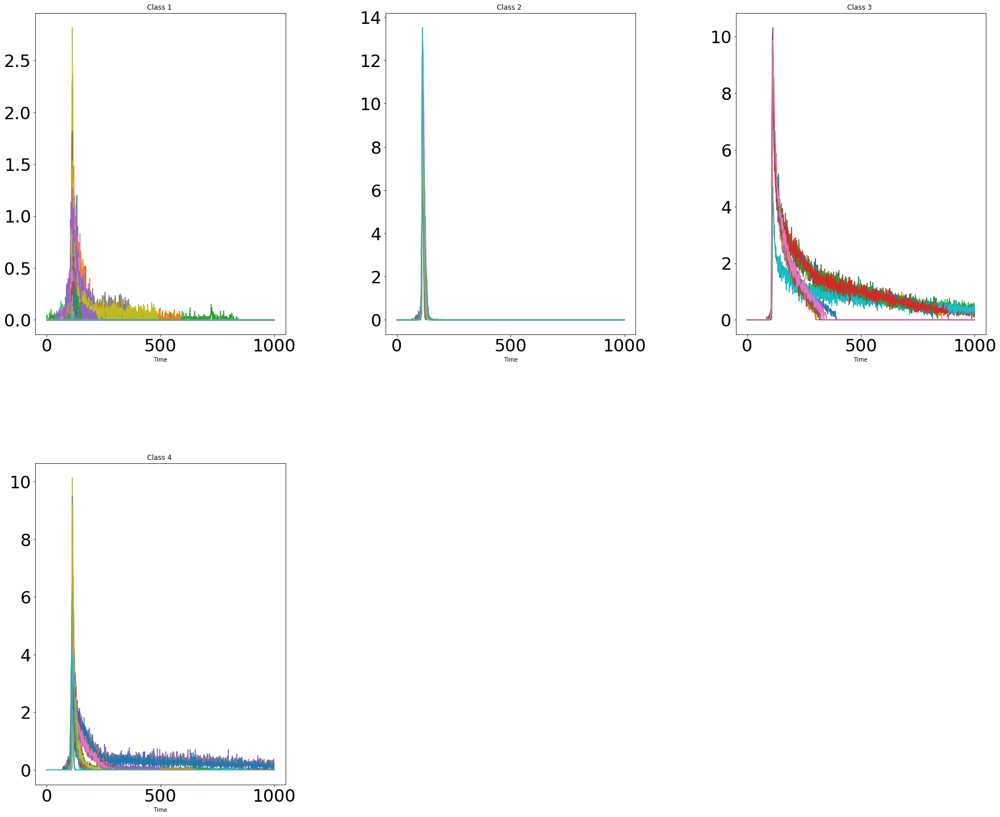

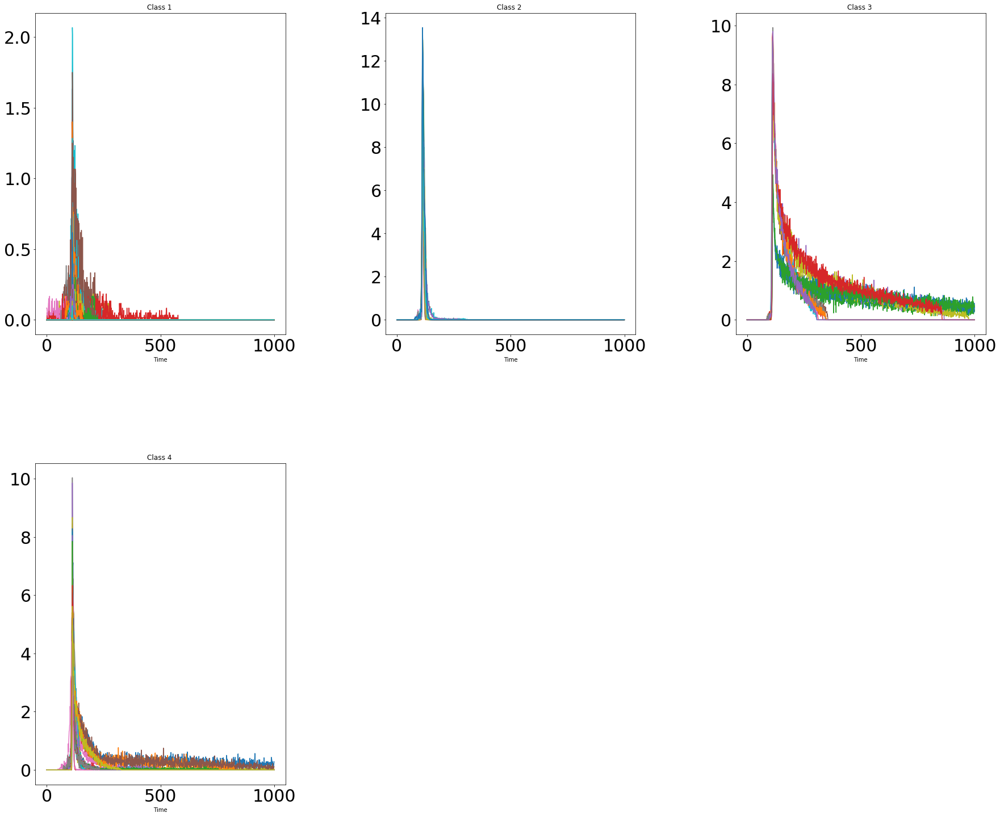

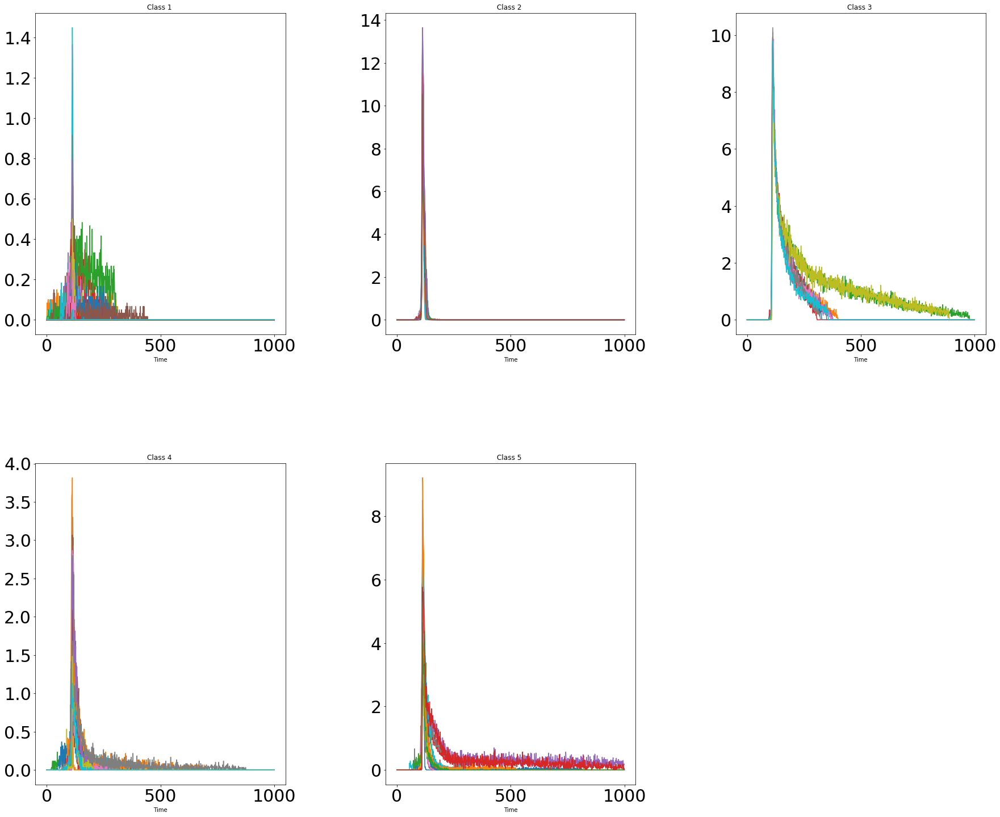

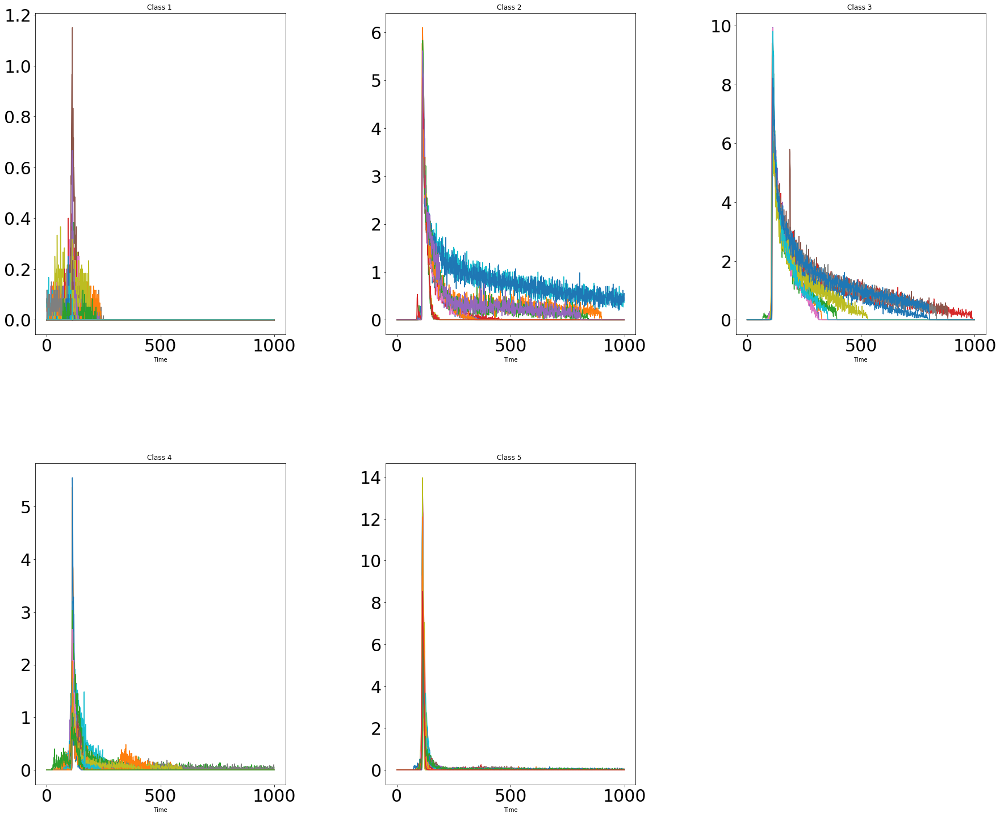

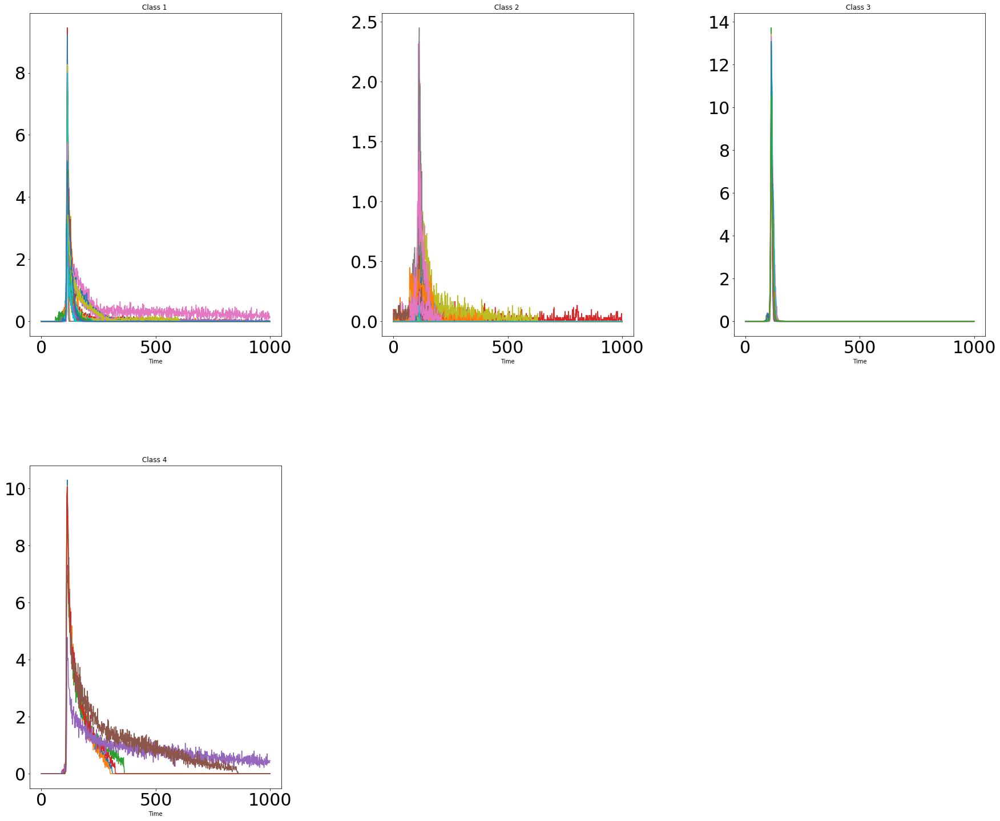

In [120]:
k_clusters_fold = [4,4,5,5,4]
print(k_clusters_fold)
for i in range(5):
  k_clusters =  k_clusters_fold[i]
  fold = i
  training_set = dataset_cutted2[valid_folds_gmm[fold]]#[valid_folds_without_bad_clusters[fold]] [valid_folds_gmm[fold]]
  if k_clusters < 10:
      colors = ["C" + str(i) for i in range(k_clusters)]
  else:
      colors = cm.rainbow(np.linspace(0, 1, k_clusters))

  fig = plt.figure(figsize=(30,25))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)    
  rows = int(np.ceil(k_clusters/3)) 
  for i in range(k_clusters):
      class_i = training_set[np.where(predictions_valid_fitted_T[fold][k_clusters-1] == i)] #[np.where(predictions_valid_fitted_T_without_bad_clusters[fold][k_clusters-1] == i)] [np.where(predictions_valid_fitted_T[fold][k_clusters-1] == i)]
      class_i = np.random.permutation(class_i)
      if i < k_clusters:
          count = i + 1
      ax = fig.add_subplot(rows, 3, count)
      ax.set_xlabel("Time")
      ax.set_title("Class %i " % (i+1))
      for burst in class_i[0:1000]:
          ax.plot(burst)

In [0]:
def plot_mean_prediction_strengths(k_prediction_strengths_cv): 
 
 
  fig, ax = plt.subplots(figsize=(50,20))
  plt.rc('xtick', labelsize=30)
  plt.rc('ytick', labelsize=30) 
  
  n_clusters = range(1,len(k_prediction_strengths_cv)+1)
  mean_min_prediction_strengths = []
  err_min_prediction_strengths = []
  
  for i in n_clusters:   
    mean_min_prediction_strength_i = np.mean(np.mean(k_prediction_strengths_cv[i],axis=1))
    err_min_prediction_strength_i = np.std(np.mean(k_prediction_strengths_cv[i],axis=1))
    
    
    mean_min_prediction_strengths.append(mean_min_prediction_strength_i)
    err_min_prediction_strengths.append(err_min_prediction_strength_i)

  
  ax.errorbar(n_clusters, mean_min_prediction_strengths, yerr=err_min_prediction_strengths)
  ax.axhline(0.8, color = "red")
  ax.set_title("Cross Validated Mean Prediction Strength", fontsize=40) 
  ax.set_xticks(n_clusters)
  ax.set_xlabel("Number of clusters",fontsize=30)
  ax.set_ylabel("prediction strength",fontsize=30) 

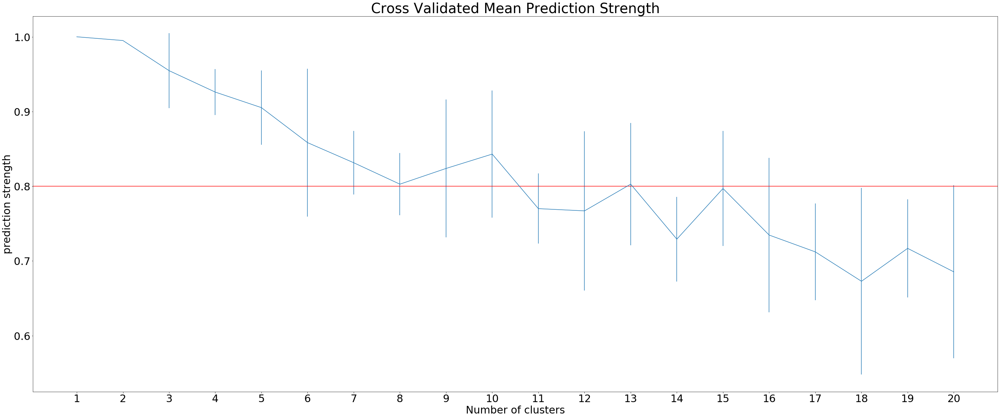

In [0]:
plot_mean_prediction_strengths(k_predictions_strength_cv_gmm)

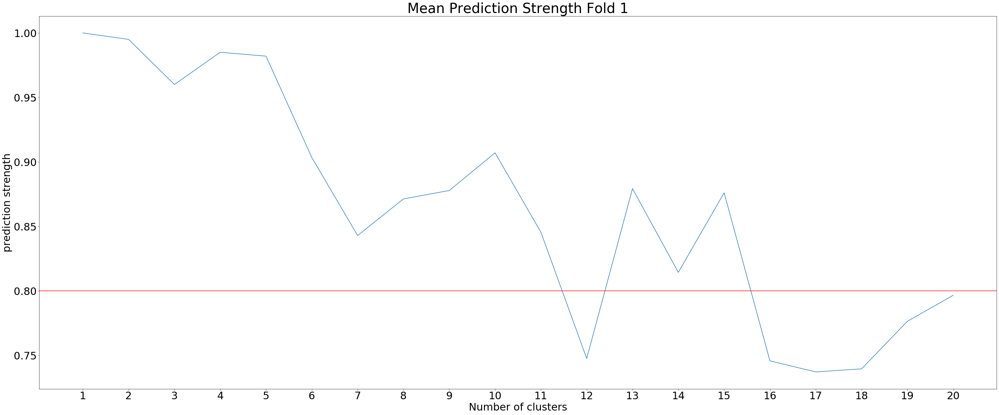

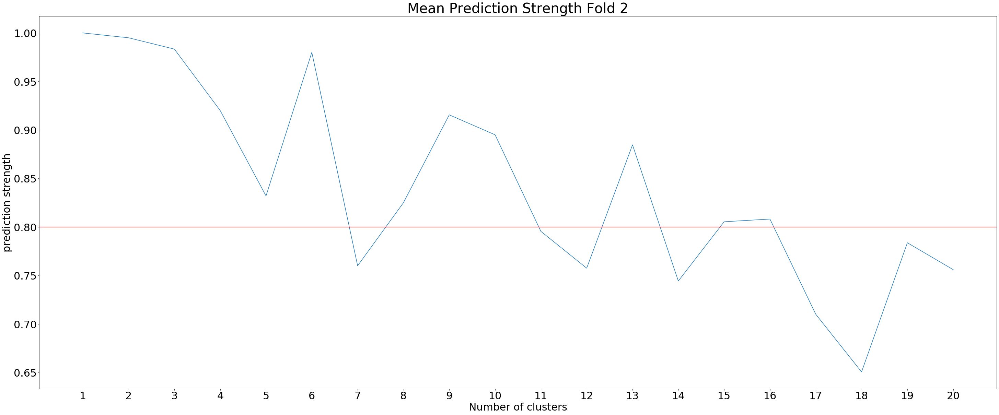

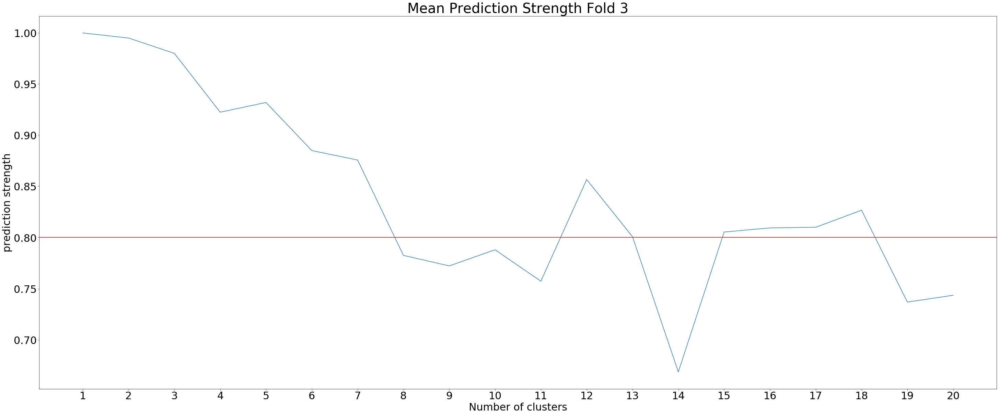

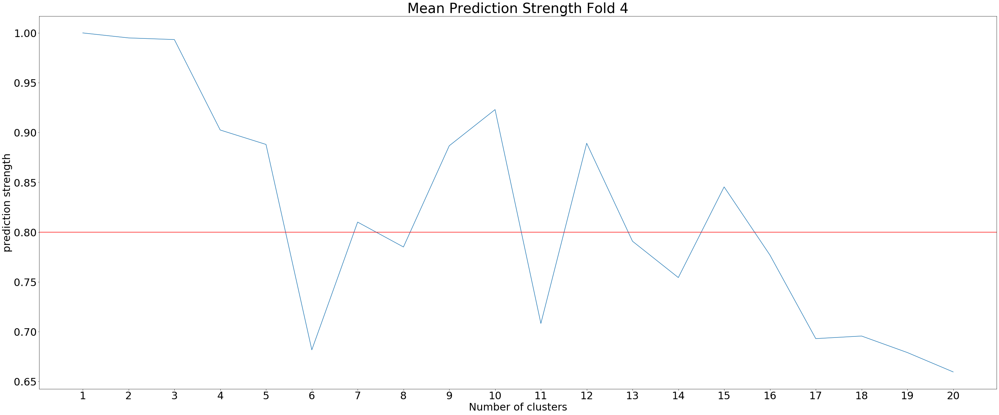

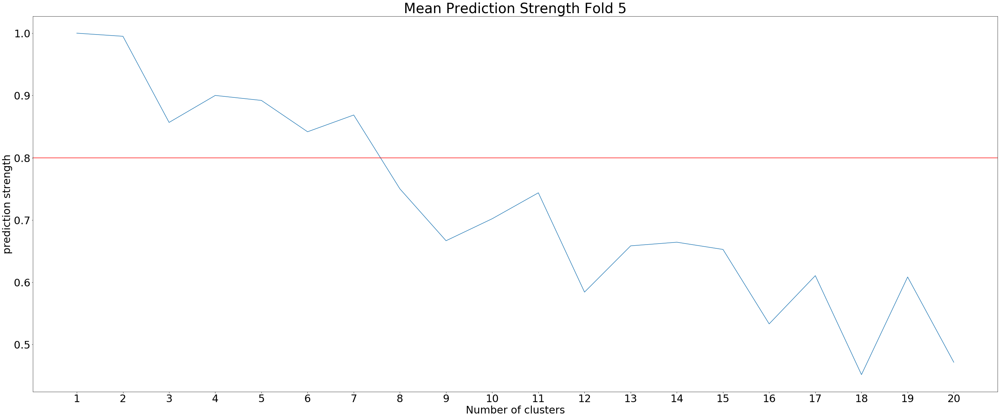

In [0]:
prediction_strength_foldwise = np.zeros((20,5))

for i in range(1,21):
    prediction_strength_foldwise[i-1] = np.mean(k_predictions_strength_cv_gmm[i],axis=1)

for i in range(5):
    fig, ax = plt.subplots(figsize=(50,20))
    plt.rc('xtick', labelsize=30)
    plt.rc('ytick', labelsize=30) 
    n_clusters = range(1,len(prediction_strength_foldwise)+1)
    ax.plot(n_clusters, prediction_strength_foldwise[:,i])
    ax.axhline(0.8, color = "red")
    ax.set_title("Mean Prediction Strength Fold %d" % (i+1), fontsize=40) 
    ax.set_xticks(n_clusters)
    ax.set_xlabel("Number of clusters",fontsize=30)
    ax.set_ylabel("prediction strength",fontsize=30) 

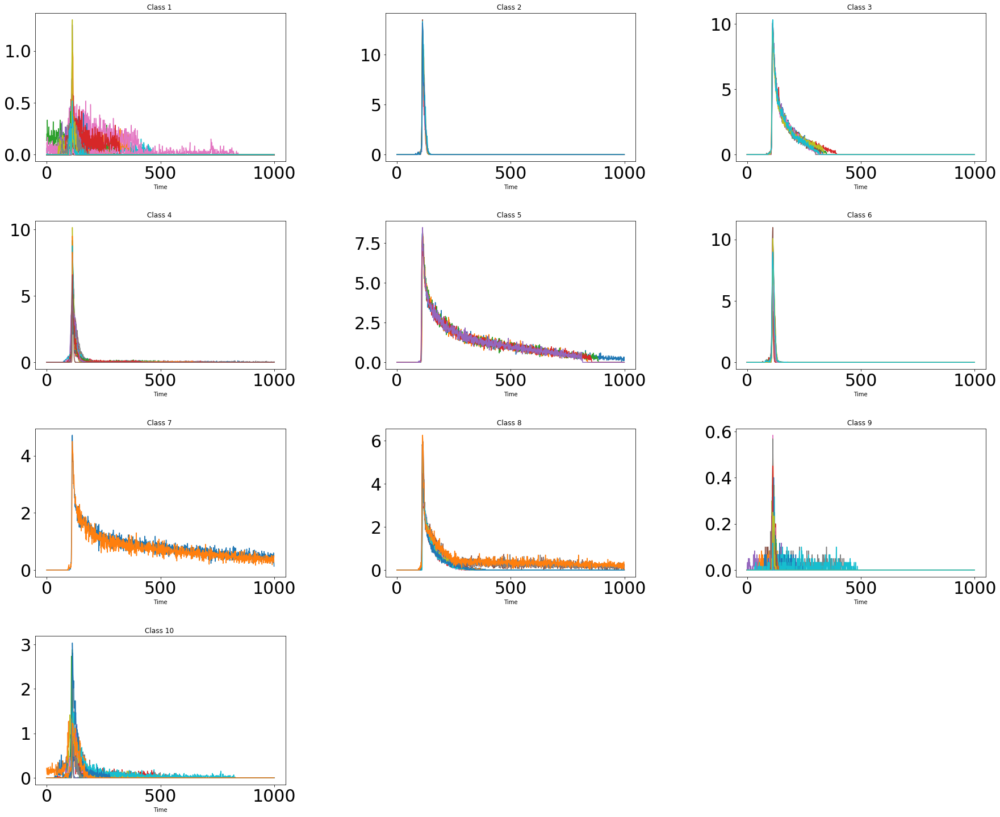

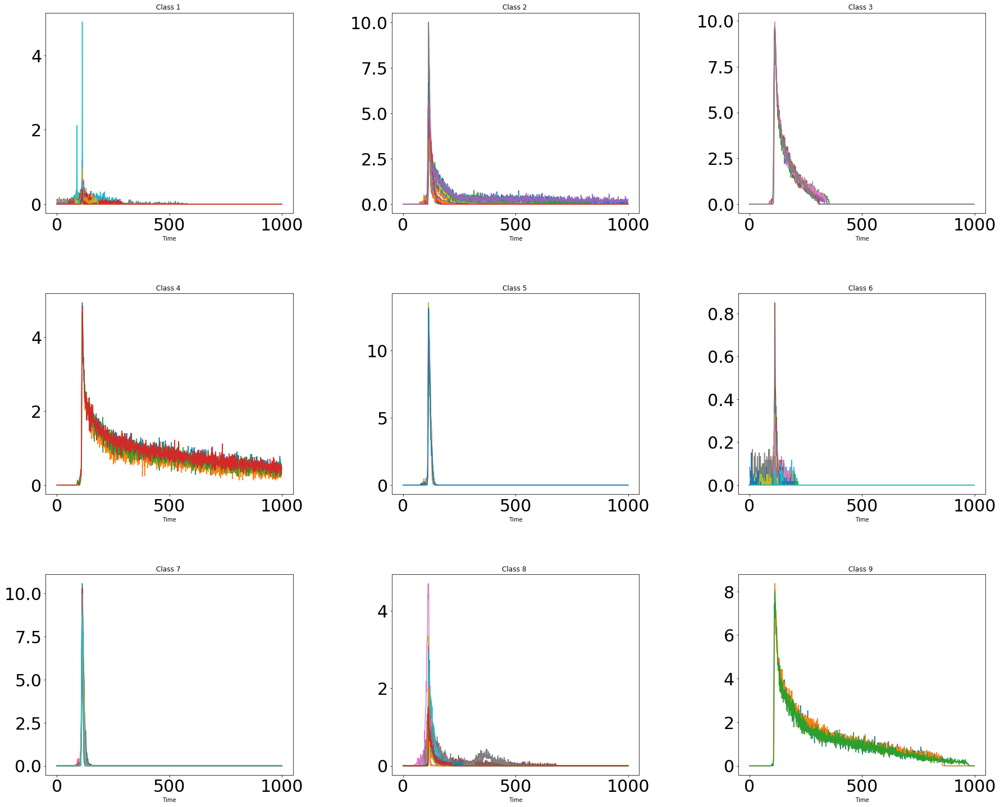

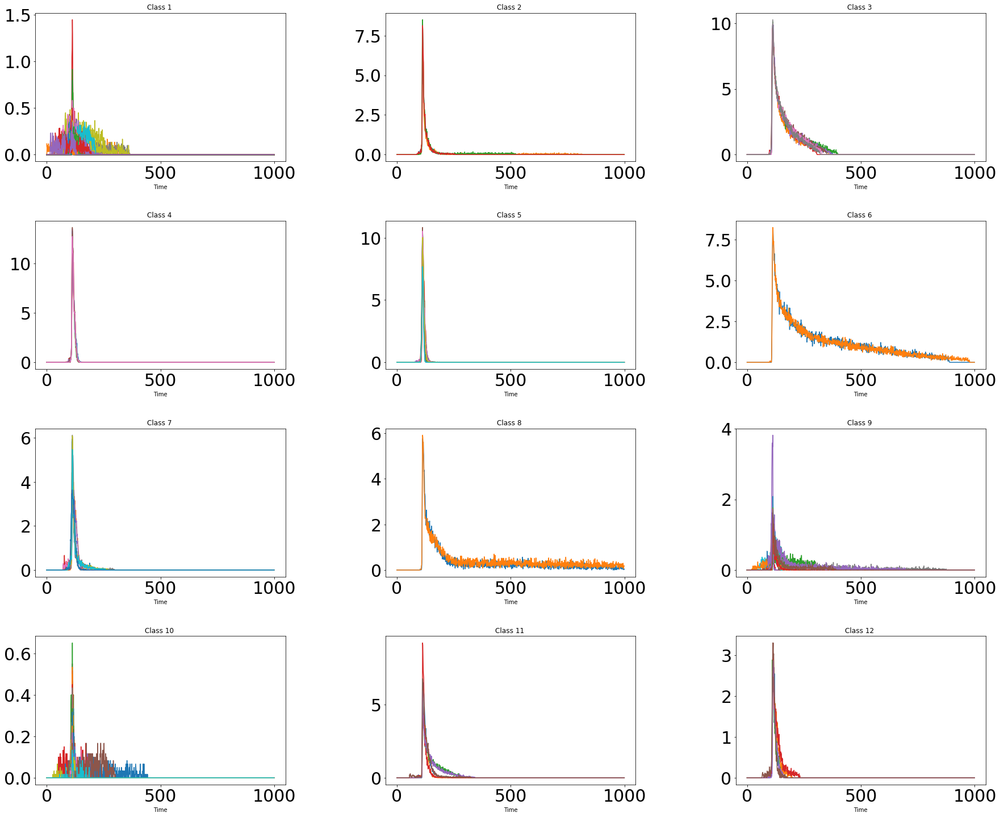

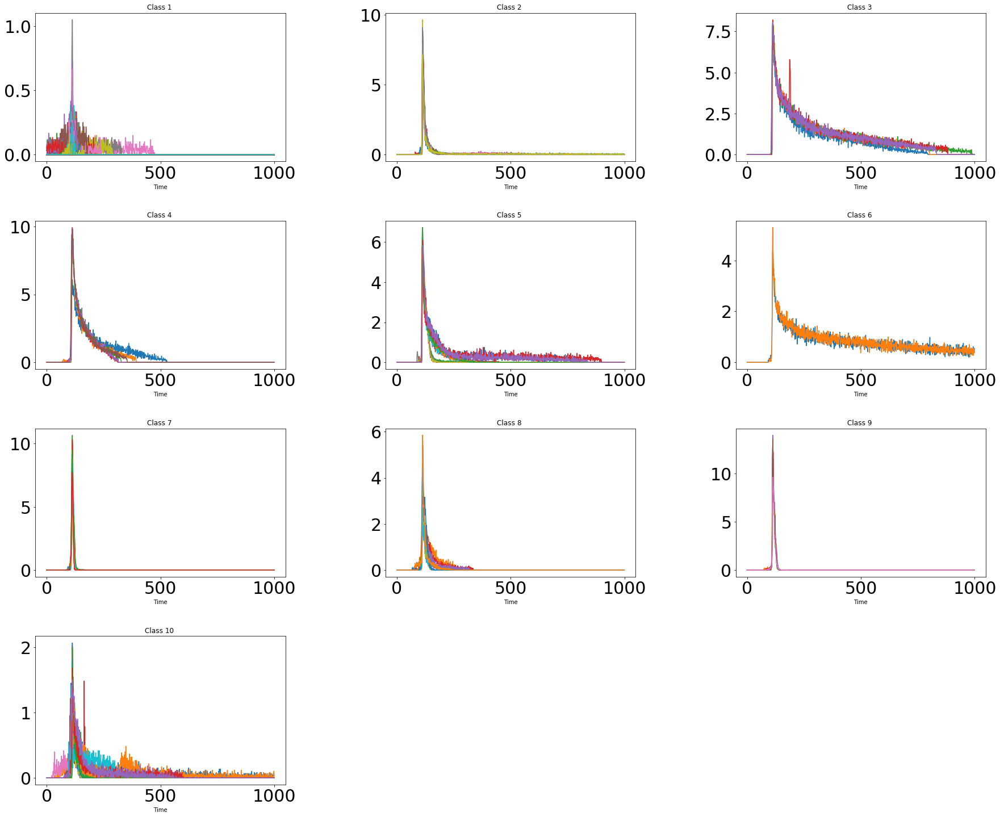

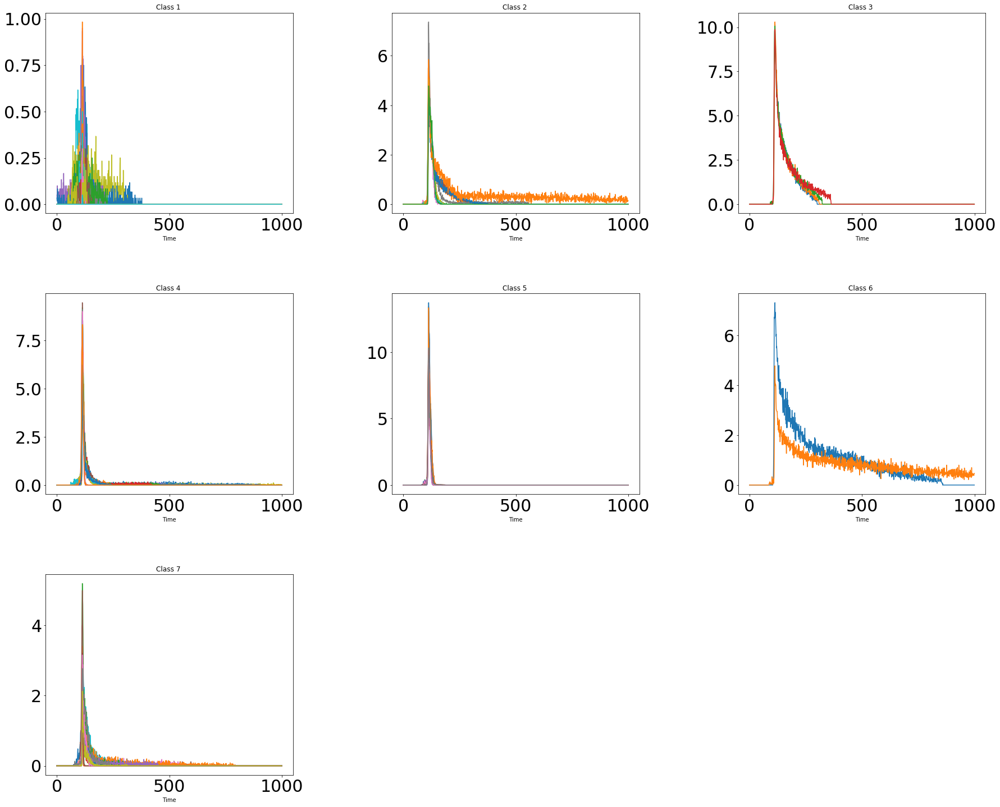

In [0]:
k_clusters_fold = [10,9,12,10,7]
for i in range(5):
  k_clusters =  k_clusters_fold[i]
  fold = i
  training_set = dataset_cutted2[valid_folds_gmm[fold]]

  if k_clusters < 10:
      colors = ["C" + str(i) for i in range(k_clusters)]
  else:
      colors = cm.rainbow(np.linspace(0, 1, k_clusters))

  fig = plt.figure(figsize=(30,25))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)    
  rows = int(np.ceil(k_clusters/3)) 
  for i in range(k_clusters):
      class_i = training_set[np.where(predictions_valid_fitted_T[fold][k_clusters-1] == i)]#dataset_cutted # data_burst_by_time
      class_i = np.random.permutation(class_i)
      if i < k_clusters:
          count = i + 1
      ax = fig.add_subplot(rows, 3, count)
      ax.set_xlabel("Time")
      ax.set_title("Class %i " % (i+1))
      for burst in class_i[0:1000]:
          ax.plot(burst)

# Graph visualization

In [0]:
!pip install networkx -q
!pip install numpy -q
!pip install pandas -q
!pip install holoviews -q
!pip install bokeh -q
!pip install scikit-image -q
!pip install xarray -q
!pip install datashader -q
!pip install IPython -q

# To use Colaboratory w/ Google Drive
!pip install -U -q PyDrive
!pip install pyvis

     |████████████████████████████████| 4.0MB 3.1MB/s 
     |████████████████████████████████| 71kB 8.7MB/s 
     |████████████████████████████████| 15.5MB 153kB/s 
     |████████████████████████████████| 1.6MB 39.3MB/s 
     |████████████████████████████████| 81kB 10.3MB/s 


In [0]:
!pip install bokeh==1.2.0. -q

     |████████████████████████████████| 17.6MB 138kB/s 


In [0]:
import csv, os
import holoviews as hv
from holoviews import opts 
from holoviews.operation.datashader import datashade, bundle_graph
from networkx.algorithms import community

# To use Colaboratory w/ Google Drive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials


from IPython.display import display_html
from bokeh.plotting import figure, output_file, show
from bokeh.models.renderers import GlyphRenderer
from holoviews.plotting.bokeh import BokehRenderer
#import holoviews.plotting.bokeh

from matplotlib import cm

In [0]:
def calculate_class_overlap(valid_folds, k_valid_fold_labels):
  fold_prev_class_bursts = []
  fold_n_burst = []
  fold_class_percentages = []
  
  for f in range(len(valid_folds)):
    prev_classes_bursts = [[valid_folds[f][np.where(k_valid_fold_labels[1][f] == 0)[0]]]]
    n_bursts = len(valid_folds[f])
    class_percentages = [[1]]

    for i in range(2,21):
      classes_bursts = []
      class_percentages_i = []

      for c in range(i):
        c_i = valid_folds[f][np.where(k_valid_fold_labels[i][f] == c)[0]]
        classes_bursts.append(c_i)
        class_percentages_c = []
        for prev_class in prev_classes_bursts[i-2]:
          overlap = np.sum(np.isin(prev_class, c_i))/len(prev_class)#n_bursts
          class_percentages_c.append(overlap)
        class_percentages_i.append(class_percentages_c)
      class_percentages.append(class_percentages_i)
      prev_classes_bursts.append(classes_bursts)
      
    fold_prev_class_bursts.append(prev_classes_bursts)
    fold_n_burst.append(n_bursts)
    fold_class_percentages.append(class_percentages)
  
  return fold_prev_class_bursts, fold_n_burst, fold_class_percentages


In [0]:
import networkx as nx

def build_burst_class_split_graph(fold_class_percentages, fold = 1, split_depth = 20, split_height = 20):
    fold = fold-1
    G = nx.DiGraph()
    class_percentage = {}

    starting_class = split_depth-split_height

    for i,k in  enumerate(fold_class_percentages[fold][starting_class:split_depth]):
        for j, c in enumerate(fold_class_percentages[fold][starting_class + i]):
            G.add_node("K%dC%d" % (starting_class+i+1,j+1))
            class_percentage["K%dC%d" % (starting_class+i+1,j+1)] = np.sum(c)
            if i >= 1:
                for l, p in enumerate(c):
                    if p > 0:
                        G.add_edge("K%dC%d" % (starting_class+i+1,j+1), "K%dC%d" % (starting_class+i,l+1), weight=p)

    nx.set_node_attributes(G, class_percentage, 'class_percentage')
    
    return G
  

In [0]:
def draw_burst_class_split_graph(G, root = "K1C1"):
  edges = G.edges()
  weights = [G[u][v]['weight']* 20 for u,v in edges]
  plt.figure(figsize = (50,30))
  pos= nx.nx_pydot.graphviz_layout(G, prog='dot', root = G.nodes[root])

  nx.draw(G,pos, node_size=[G.nodes[str(i)]["class_percentage"] * 15000 for i in list(G.nodes())], arrows=False, with_labels=True, font_size = 30, width = weights)#(G, pos, with_labels=False, arrows=False)
  #plt.savefig('nx_test.png')  

In [0]:
fold_prev_class_bursts_gmm, fold_n_burst_gmm, fold_class_percentages_gmm = calculate_class_overlap(valid_folds_gmm, k_valid_fold_labels_gmm)

In [0]:
G_gmm = build_burst_class_split_graph(fold_class_percentages_gmm, fold = 5, split_depth = 16,  split_height = 9)

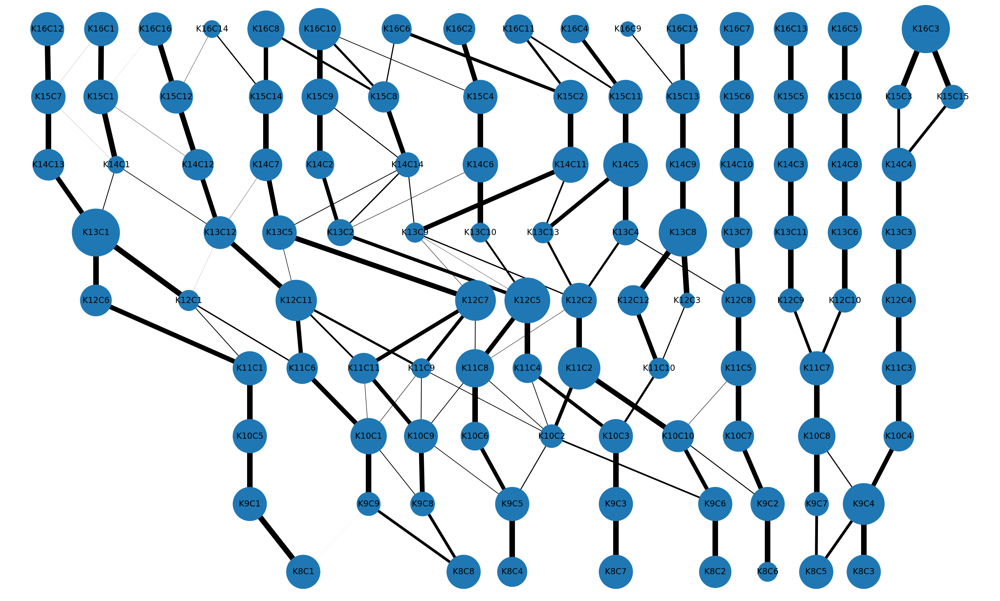

In [0]:
draw_burst_class_split_graph(G_gmm, root = "K8C1")

In [0]:
#plt.rc('xtick', labelsize=100)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=100)    # fontsize of the tick labels

plt.rc('ytick', labelsize=20)
plt.rc('xtick', labelsize=20)

for f in range(5):
    for k in range(1,20):
        cutoff =  k
        fold = f
        training_set = dataset_cutted2[valid_folds_gmm[fold]]


        for i in range(cutoff):
            #plt.figure(figsize=(150,75))
            plt.figure(figsize=(30,15))
            class_i = training_set[np.where(predictions_valid_fitted_T[fold][cutoff-1] == i)]
            class_i = np.random.permutation(class_i)
            
            #plt.xlabel("Time", fontsize=150)
            plt.xlabel("Time", fontsize=30)
            #plt.ylabel("Spike Count", fontsize=150)
            plt.ylabel("Spike Count", fontsize=30)
            #plt.title("Class %d (K = %d)" % ((i+1),k), fontsize = 200)
            plt.title("Class %d (K = %d)" % ((i+1),k), fontsize = 40)
            for burst in class_i[0:1000]:
                #plt.plot(burst, linewidth=8)
                plt.plot(burst, linewidth=3)
            plt.savefig('/content/gdrive/My Drive/Burst_data/K_Class_Bursts_GMM/fold=%d_k=%d_C=%d.png' % (fold,k,(i+1)))
            plt.close()


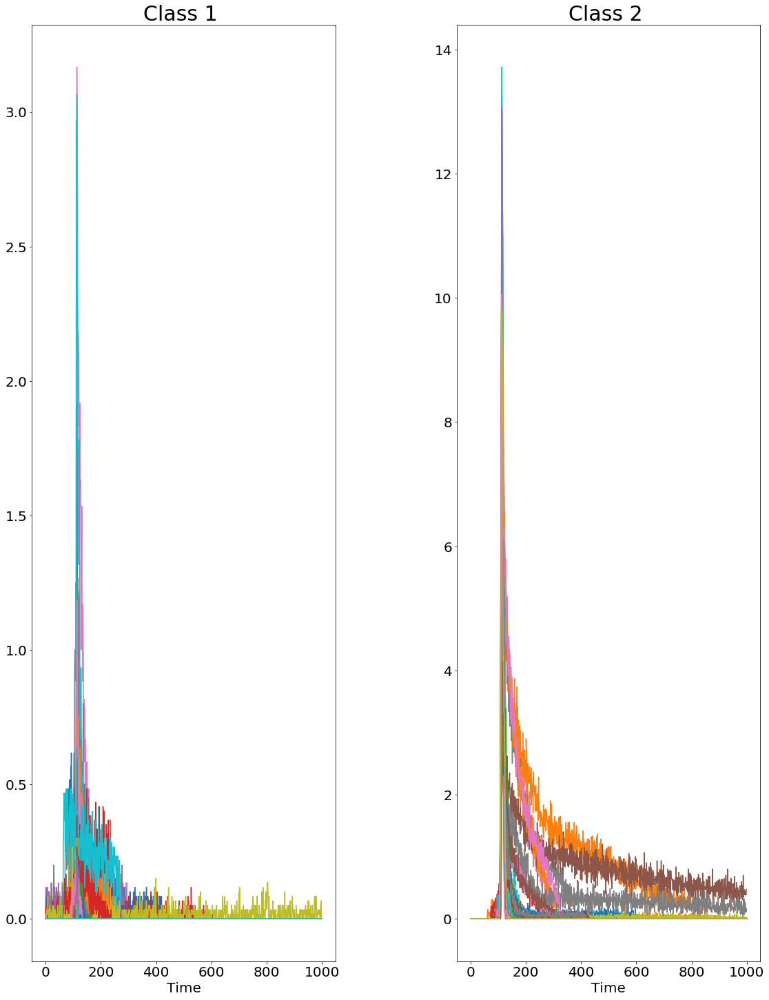

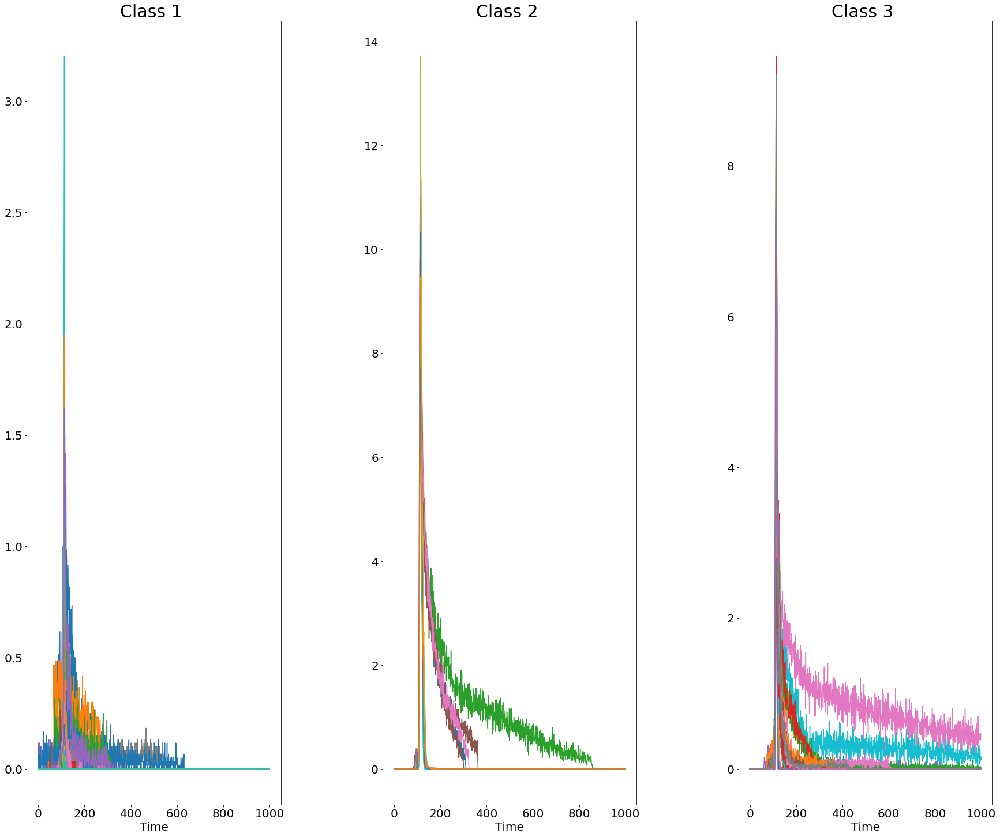

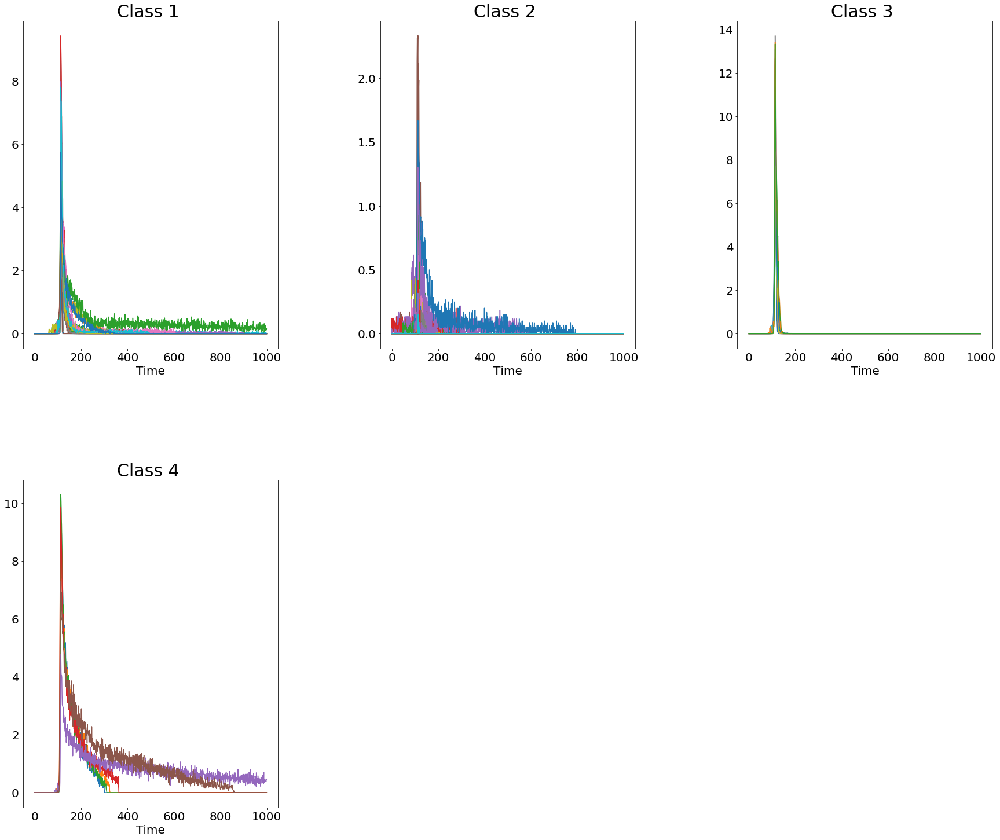

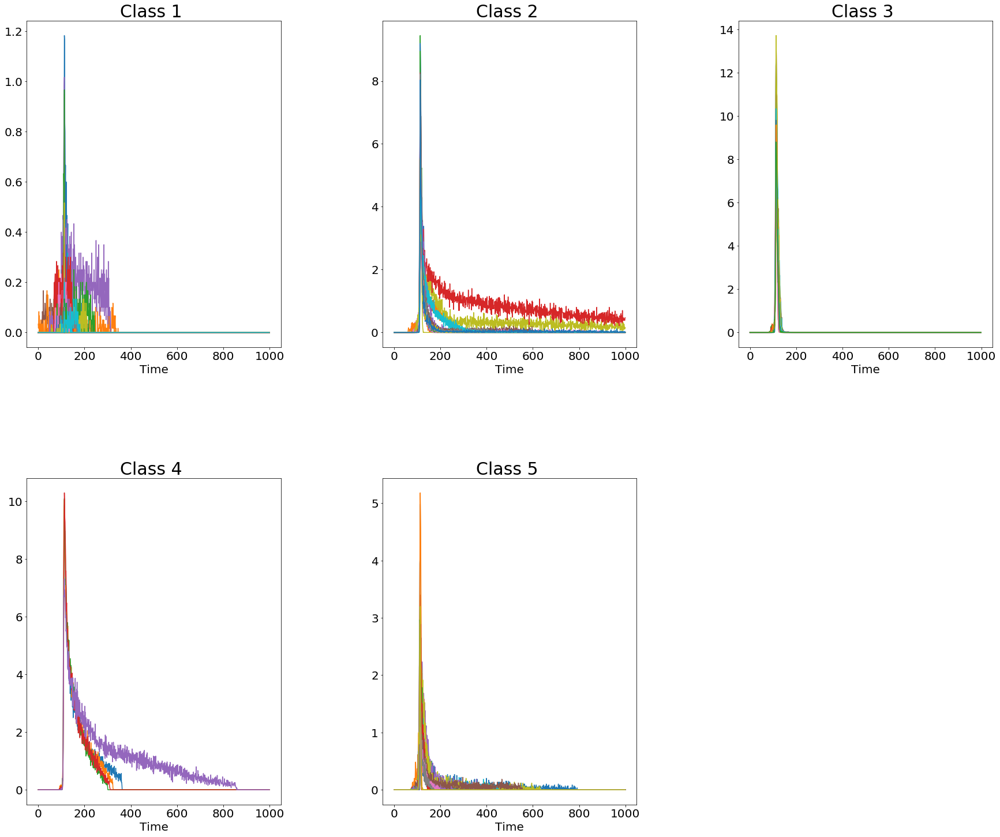

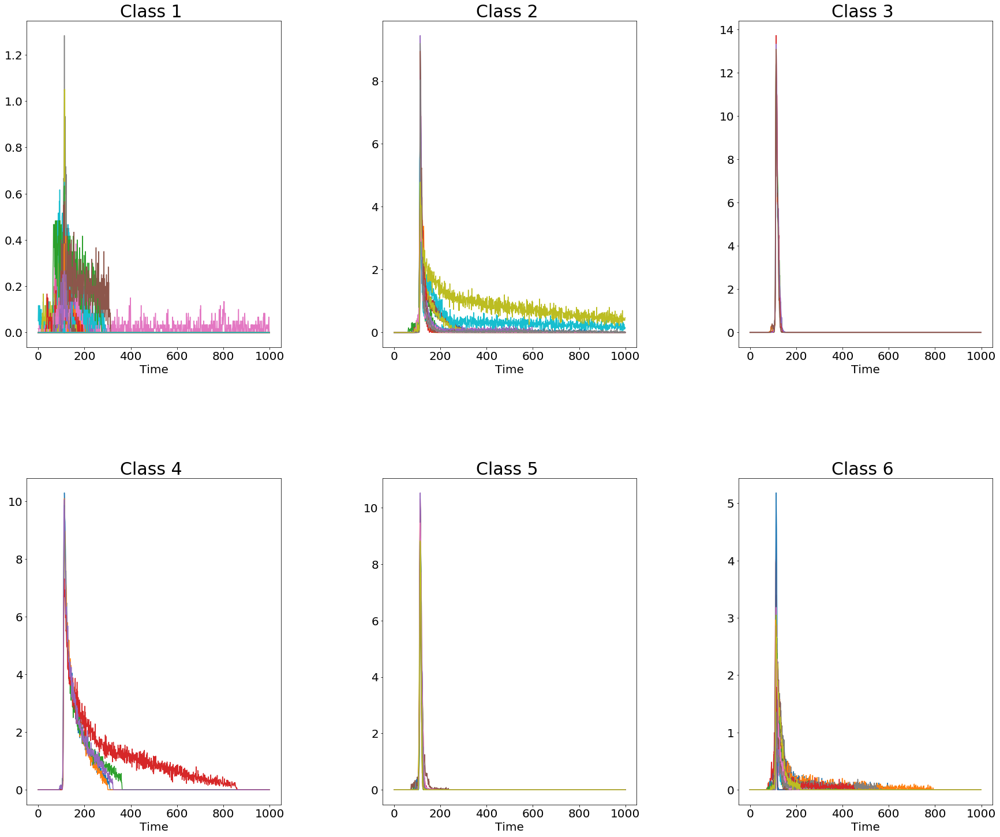

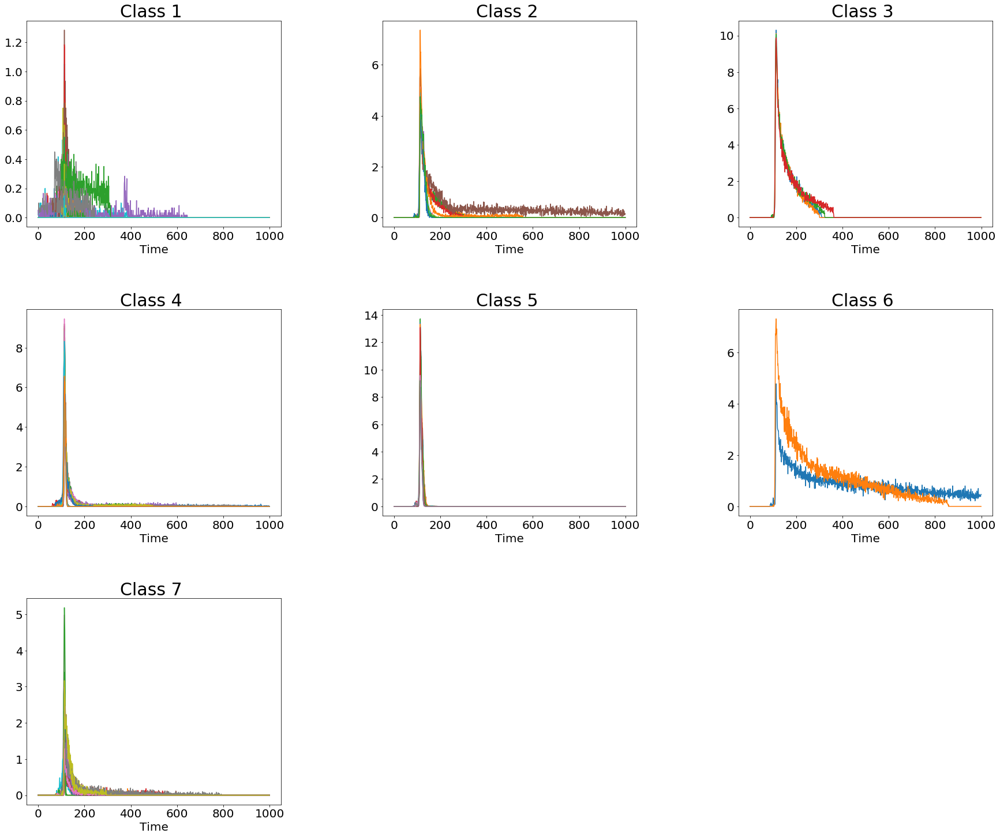

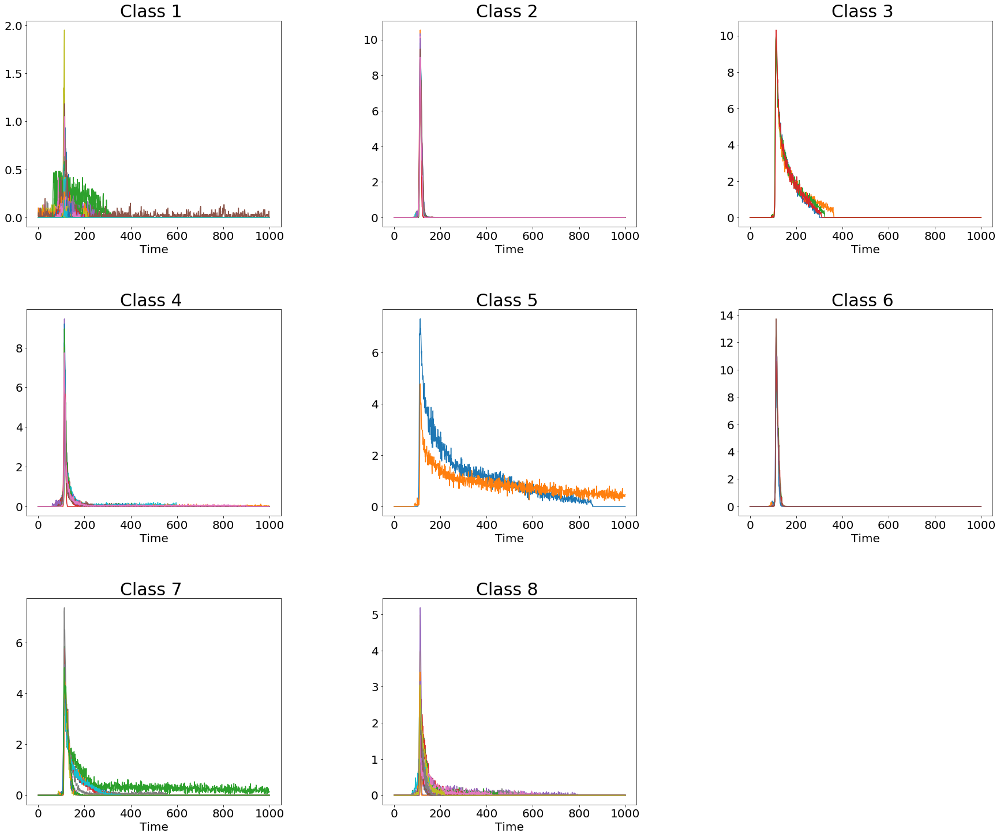

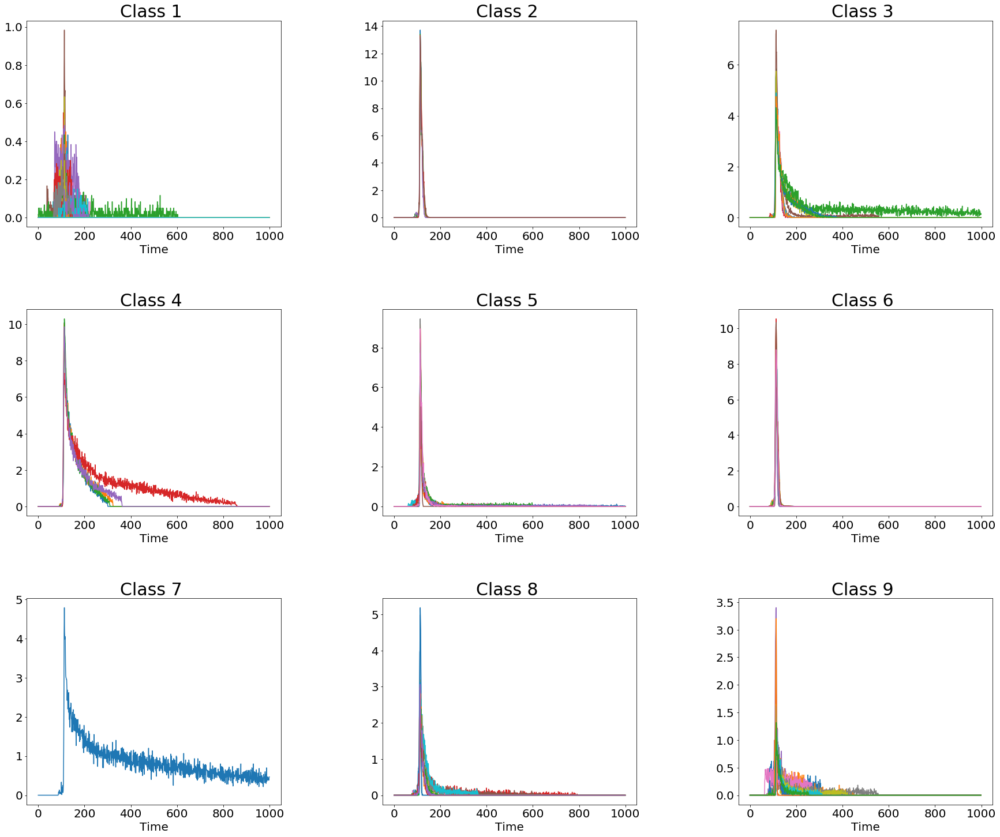

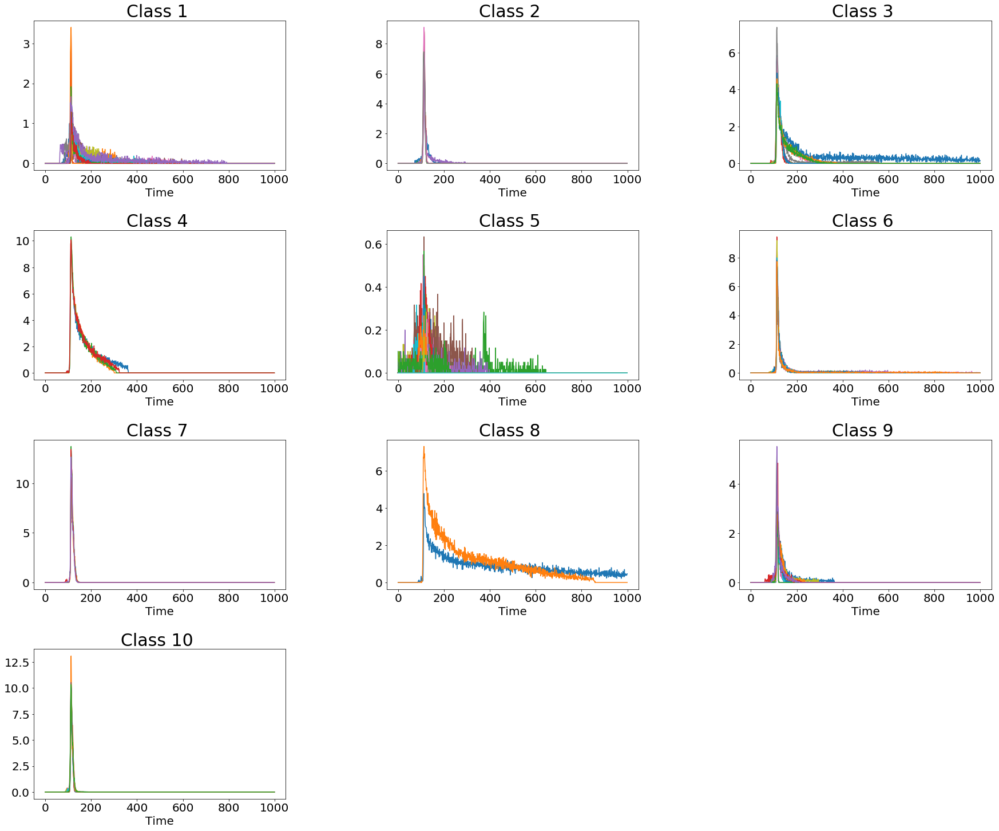

In [0]:
for i in range(2,11):
  cutoff =  i
  fold = 4
  training_set = dataset_cutted2[valid_folds_gmm[fold]]

  if cutoff < 10:
      colors = ["C" + str(i) for i in range(cutoff)]
  else:
      colors = cm.rainbow(np.linspace(0, 1, cutoff))

  fig = plt.figure(figsize=(30,25))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)    
  rows = int(np.ceil(cutoff/3)) 
  for i in range(cutoff):
      class_i = training_set[np.where(predictions_valid_fitted_T[fold][cutoff-1] == i)]#dataset_cutted # data_burst_by_time
      class_i = np.random.permutation(class_i)
      if i < cutoff:
          count = i + 1

      ax = fig.add_subplot(rows, 3, count)
      ax.set_xlabel("Time", fontsize=20)
      ax.set_title("Class %i " % (i+1), fontsize = 30)
      for burst in class_i[0:1000]:
        ax.plot(burst)

['fold=0_k=1_C=1.png', 'fold=0_k=2_C=1.png', 'fold=0_k=2_C=2.png', 'fold=0_k=3_C=1.png', 'fold=0_k=3_C=2.png', 'fold=0_k=3_C=3.png', 'fold=0_k=4_C=1.png', 'fold=0_k=4_C=2.png', 'fold=0_k=4_C=3.png', 'fold=0_k=4_C=4.png', 'fold=0_k=5_C=1.png', 'fold=0_k=5_C=2.png', 'fold=0_k=5_C=3.png', 'fold=0_k=5_C=4.png', 'fold=0_k=5_C=5.png', 'fold=0_k=6_C=1.png', 'fold=0_k=6_C=2.png', 'fold=0_k=6_C=3.png', 'fold=0_k=6_C=4.png', 'fold=0_k=6_C=5.png', 'fold=0_k=6_C=6.png', 'fold=0_k=7_C=1.png', 'fold=0_k=7_C=2.png', 'fold=0_k=7_C=3.png', 'fold=0_k=7_C=4.png', 'fold=0_k=7_C=5.png', 'fold=0_k=7_C=6.png', 'fold=0_k=7_C=7.png', 'fold=0_k=8_C=1.png', 'fold=0_k=8_C=2.png', 'fold=0_k=8_C=3.png', 'fold=0_k=8_C=4.png', 'fold=0_k=8_C=5.png', 'fold=0_k=8_C=6.png', 'fold=0_k=8_C=7.png', 'fold=0_k=8_C=8.png', 'fold=0_k=9_C=1.png', 'fold=0_k=9_C=2.png', 'fold=0_k=9_C=3.png', 'fold=0_k=9_C=4.png', 'fold=0_k=9_C=5.png', 'fold=0_k=9_C=6.png', 'fold=0_k=9_C=7.png', 'fold=0_k=9_C=8.png', 'fold=0_k=9_C=9.png', 'fold=0_k

In [0]:
image_files = os.listdir('/content/gdrive/My Drive/Burst_data/K_Class_Bursts_GMM/')
fold_image_files = []
fold = 5
from_class = 8
to_class = 16


for file in image_files:
    if "fold=%d" % (fold -1) in file:
        fold_image_files.append(file)



filtered_files = [file for file in fold_image_files if((to_class+ 1) > int(file.split("_")[1].split("=")[1]) > (from_class -1))]
fold_image_files = np.core.defchararray.add(np.repeat('/content/gdrive/My Drive/Burst_data/K_Class_Bursts_GMM/', len(filtered_files)), np.asarray(filtered_files).astype("str"))


from io import BytesIO
from PIL import Image
import base64


def embeddable_image(infile):
    image = Image.open(infile)
    buffer = BytesIO()
    image.save(buffer, format='png')
    
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()
  
  
img = list(map(embeddable_image, fold_image_files))

In [0]:
print(G_gmm.edges)

[('K2C1', 'K1C1'), ('K2C2', 'K1C1'), ('K3C1', 'K2C1'), ('K3C2', 'K2C2'), ('K3C3', 'K2C1'), ('K3C3', 'K2C2'), ('K4C1', 'K3C3'), ('K4C2', 'K3C1'), ('K4C3', 'K3C2'), ('K4C3', 'K3C3'), ('K4C4', 'K3C2'), ('K4C4', 'K3C3'), ('K5C1', 'K4C2'), ('K5C2', 'K4C1'), ('K5C2', 'K4C4'), ('K5C3', 'K4C3'), ('K5C4', 'K4C4'), ('K5C5', 'K4C1'), ('K5C5', 'K4C2'), ('K6C1', 'K5C1'), ('K6C2', 'K5C2'), ('K6C3', 'K5C3'), ('K6C4', 'K5C4'), ('K6C5', 'K5C2'), ('K6C5', 'K5C3'), ('K6C6', 'K5C5'), ('K7C1', 'K6C1'), ('K7C2', 'K6C2'), ('K7C3', 'K6C4'), ('K7C4', 'K6C2'), ('K7C4', 'K6C5'), ('K7C5', 'K6C3'), ('K7C5', 'K6C5'), ('K7C6', 'K6C2'), ('K7C6', 'K6C4'), ('K7C7', 'K6C6'), ('K8C1', 'K7C1'), ('K8C2', 'K7C4'), ('K8C2', 'K7C5'), ('K8C3', 'K7C3'), ('K8C4', 'K7C4'), ('K8C5', 'K7C6'), ('K8C6', 'K7C5'), ('K8C7', 'K7C2'), ('K8C8', 'K7C7'), ('K9C1', 'K8C1'), ('K9C2', 'K8C6'), ('K9C3', 'K8C7'), ('K9C4', 'K8C3'), ('K9C4', 'K8C5'), ('K9C5', 'K8C4'), ('K9C6', 'K8C2'), ('K9C7', 'K8C5'), ('K9C8', 'K8C8'), ('K9C9', 'K8C1'), ('K9C9', 

In [0]:
from bokeh.models import HoverTool
from bokeh.models import TapTool
from bokeh.models import CustomJS, HoverTool, Div, Row
from bokeh.events import Tap
from bokeh.io import output_notebook 
from bokeh.plotting import show, output_file, save
from bokeh.embed import components


#output_notebook()

fold = 5
root = "K8C1" 
filename = "GMM_cluster_splitting_fold=%d_K8_to_K16" % fold


TOOLTIPS = """
    <div>
        <div>
            <img
                src="@img" height="450" alt="@img" width="900"
                style="float: left; margin: 0px 0px 0px 0px;"
                border="2"
            ></img>
        </div>
   
    </div>
"""

hover = HoverTool(tooltips=TOOLTIPS)





'''The essential functionality'''
nxg = G_gmm
hv.extension('bokeh')
kwargs = dict(width=2700, height=1650,padding = 0.15, xaxis=None, yaxis=None)
hv.opts.defaults(hv.opts.Nodes(**kwargs), hv.opts.Graph(**kwargs), )

pos= nx.nx_pydot.graphviz_layout(G_gmm, prog='dot', root = nxg.nodes[root])

nx.set_node_attributes(nxg, dict(zip(G_gmm.nodes, img)), 'img')
nx.set_node_attributes(nxg, dict(zip(G_gmm.nodes, G_gmm.nodes)), 'label')
nx.set_node_attributes(nxg, dict(zip(G_gmm.nodes,[G_gmm.nodes[str(i)]["class_percentage"] * 100 for i in list(G_gmm.nodes())])), 'size')
nx.set_edge_attributes(nxg, dict(zip(G_gmm.edges,[G_gmm[u][v]['weight']*10 for u,v in G_gmm.edges])), 'weights')

# collect graph from NetworkX 
my_graph = hv.Graph.from_networkx(nxg, pos).options(tools = [hover,"tap"], node_size="size", edge_line_width="weights", )
c = hv.Labels(my_graph.nodes, ['x', 'y'], 'label')

# bundle edges 
#bundled = bundle_graph(my_graph)
#bundled.opts(padding=0.01) 


from bokeh.plotting import figure, show
from bokeh.io import output_notebook
hv.extension('bokeh')
#output_notebook()
#show(bundled)
#bundled*c

renderer = hv.renderer('bokeh')
renderer.save(my_graph*c, '/content/gdrive/My Drive/Burst_data/' + filename)

#plot = renderer.get_plot(my_graph*c).state

#from bokeh.io import output_file, save, show
#save(plot, '/content/gdrive/My Drive/Burst_data/plot.html')

Output hidden; open in https://colab.research.google.com to view.